# Wasserstein GAN with Gradient Penalty
## For generation of features based on LHCO2020 datasets

In [1]:
import glob
import imageio
import os
import PIL
from tensorflow.keras import layers
import time
from IPython import display

import numpy as np
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow.keras.backend as K

print(tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print(physical_devices[0])

tf.random.set_seed(1234)

2.1.0
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
train_features = [idx for idx in range(784)]

In [3]:
# Network hyperparameters
BATCH_SIZE = 1024
EPOCHS = 1000

# Adam hyperparameters as recommended by arXiv:1704.00028
# Discriminator learning rate has been lowered to discourage mode collapse
LEARNING_RATE_GEN = 1e-4
LEARNING_RATE_DISC = 1e-5
BETA_1 = 0
BETA_2 = 0.9

# WGAN hyperparameters
N_CRITIC = 5
C_LAMBDA = 10

In [4]:
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()

train_images = np.delete(train_images, [i for i in range(train_images.shape[0] % (BATCH_SIZE * 4))], axis = 0)
train_labels = np.delete(train_labels, [i for i in range(train_labels.shape[0] % (BATCH_SIZE * 4))], axis = 0)

train_images = train_images.reshape(train_images.shape[0], 784).astype('float32')

scaler = MinMaxScaler((-1,1)).fit(train_images)
train_images = scaler.transform(train_images)

In [5]:
X_train, X_test = train_test_split(train_images, test_size = 0.25, random_state = 1234)
len_dataset = int(X_train.shape[0] / BATCH_SIZE)
len_testset = int(X_test.shape[0] / BATCH_SIZE)
print("Dataset consists of {} batches of {} samples each, total {} samples".format(len_dataset, BATCH_SIZE, len_dataset * BATCH_SIZE))
print("Testset consists of {} batches of {} samples each, total {} samples".format(len_testset, BATCH_SIZE, len_testset * BATCH_SIZE))

Dataset consists of 42 batches of 1024 samples each, total 43008 samples
Testset consists of 14 batches of 1024 samples each, total 14336 samples


In [6]:
train_dataset = tf.data.Dataset.from_tensor_slices(X_train).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(X_test).batch(BATCH_SIZE)

In [7]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(len(train_features), activation='tanh'))
    assert model.output_shape == (None, len(train_features))

    return model

In [8]:
generator = make_generator_model()

In [9]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(50))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(1)) # WGAN: No sigmoid activation in last layer

    return model

In [10]:
discriminator = make_discriminator_model()

In [11]:
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                39250     
_________________________________________________________________
batch_normalization (BatchNo (None, 50)                200       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 50)                0         
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 50)                2550      
_________________________________________________________________
batch_normalization_1 (Batch (None, 50)                200       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 50)                0

In [12]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 50)                39250     
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 50)                2550      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                

In [13]:
@tf.function
def gradient_penalty(real, fake, epsilon): 
    # mixed_images = real * epsilon + fake * (1 - epsilon)
    mixed_images = fake + epsilon * (real - fake)
    with tf.GradientTape() as tape:
        tape.watch(mixed_images) 
        mixed_scores = discriminator(mixed_images)
        
    gradient = tape.gradient(mixed_scores, mixed_images)[0]
    
    gradient_norm = tf.norm(gradient)
    penalty = tf.math.reduce_mean((gradient_norm - 1)**2)
    return penalty

In [14]:
@tf.function
def discriminator_loss(real_output, fake_output, gradient_penalty):
    loss = tf.math.reduce_mean(fake_output) - tf.math.reduce_mean(real_output) + C_LAMBDA * gradient_penalty
    return loss

In [15]:
@tf.function
def generator_loss(fake_output):
    gen_loss = -1. * tf.math.reduce_mean(fake_output)
    return gen_loss

In [16]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_GEN, beta_1=BETA_1, beta_2=BETA_2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_DISC, beta_1=BETA_1, beta_2=BETA_2)

In [17]:
# Convert tensor to float for loss function plotting
def K_eval(x):
    try:
        return K.get_value(K.to_dense(x))
    except:
        eval_fn = K.function([], [x])
        return eval_fn([])[0]

In [18]:
@tf.function
def train_step_generator():
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    fake_output = discriminator(generated_images, training=True)
    gen_loss = generator_loss(fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  
  return gen_loss

In [19]:
@tf.function
def train_step_discriminator(images):
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    epsilon = tf.random.uniform([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return disc_loss

In [20]:
@tf.function
def evaluate_generator():
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    fake_output = discriminator(generated_images, training=False)

    gen_loss = generator_loss(fake_output)

    return gen_loss

In [21]:
@tf.function
def evaluate_discriminator(images):
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    real_output = discriminator(images, training=False)
    fake_output = discriminator(generated_images, training=False)

    epsilon = tf.random.uniform([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

    return disc_loss

In [22]:
def graph_gan(generator):
    # realdata = scaler.inverse_transform(X_train)
    fakedata = scaler.inverse_transform(generator(tf.random.normal((1, len(train_features))), training=False))

    fakedata = fakedata.reshape((28, 28))

    plt.imshow(fakedata)
    plt.show()

In [23]:
def graph_pixel(generator):
    realdata = scaler.inverse_transform(X_train)
    fakedata = scaler.inverse_transform(generator(tf.random.normal((1000, len(train_features))), training=False))

    realdata = realdata.reshape((-1,28,28))
    fakedata = fakedata.reshape((-1,28,28))

    realcenters = realdata[:,14,14]
    fakecenters = fakedata[:,14,14]

    plt.title("Center pixel intensities")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("Pixel intensity")
    plt.hist(fakecenters, bins = 25, range = (0,255), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.hist(realcenters, bins = 25, range = (0,255), color = "tab:orange", alpha = 0.5, label = "MNIST", density = True)
    plt.legend()
    plt.show()

In [24]:
train_gen_losses = []
train_disc_losses = []
test_gen_losses = []
test_disc_losses = []

In [25]:
def graph_genloss():
    plt.title("Generator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_gen_losses, 'b', label = "Training loss")
    plt.plot(test_gen_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [26]:
def graph_discloss():
    plt.title("Discriminator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_disc_losses, 'b', label = "Training loss")
    plt.plot(test_disc_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [27]:
def train(dataset, testset, epochs, n_critic):
  for epoch in tqdm(range(epochs)):
    print_losses = ((epoch + 1) % 1 == 0)
    draw_outputs = ((epoch + 1) % 10 == 0)

    train_gen_loss = 0
    train_disc_loss = 0

    test_gen_loss = 0
    test_disc_loss = 0

    # Training

    for batchnum, image_batch in enumerate(dataset):
      if random.random() < 1 / n_critic:
        train_gen_loss += K_eval(train_step_generator()) / len_dataset * n_critic
      train_disc_loss += K_eval(train_step_discriminator(image_batch)) / len_dataset
    
    train_gen_losses.append(train_gen_loss)
    train_disc_losses.append(train_disc_loss)

    # Evaluation

    for batchnum, test_batch in enumerate(testset):
      test_gen_loss += K_eval(evaluate_generator()) / len_testset
      test_disc_loss += K_eval(evaluate_discriminator(test_batch)) / len_testset

    test_gen_losses.append(test_gen_loss)
    test_disc_losses.append(test_disc_loss)

    # Logging

    if print_losses:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      print()
      print("Generator training loss: " + str(train_gen_losses[-1]))
      print("Discriminator training loss: " + str(train_disc_losses[-1]))
      print()
      print("Generator validation loss: " + str(test_gen_losses[-1]))
      print("Discriminator validation loss: " + str(test_disc_losses[-1]))

    if draw_outputs:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      graph_gan(generator)
      graph_pixel(generator)
      graph_genloss()
      graph_discloss()

  0%|          | 1/1000 [00:06<1:40:54,  6.06s/it]
Epoch 1:

Generator training loss: -0.14411323016420716
Discriminator training loss: -0.028310882548491154

Generator validation loss: -0.22420432525021686
Discriminator validation loss: -0.12741229576723914
  0%|          | 2/1000 [00:06<48:52,  2.94s/it]  
Epoch 2:

Generator training loss: -0.48791293232213884
Discriminator training loss: -0.4226232220729192

Generator validation loss: -0.32417000191552303
Discriminator validation loss: -0.9738286435604094
  0%|          | 3/1000 [00:07<31:43,  1.91s/it]
Epoch 3:

Generator training loss: -0.43436706775710693
Discriminator training loss: -1.0453042288621264

Generator validation loss: -0.3656409297670637
Discriminator validation loss: -1.5681702920368739
  0%|          | 4/1000 [00:08<23:48,  1.43s/it]
Epoch 4:

Generator training loss: -0.6418606851782118
Discriminator training loss: -1.6231170906907038

Generator validation loss: -0.4331531524658203
Discriminator validation loss: 

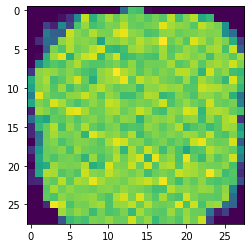

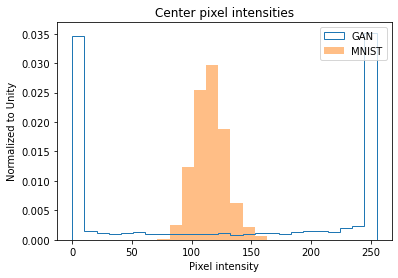

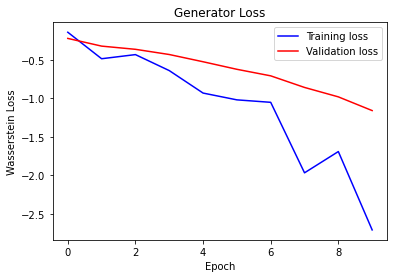

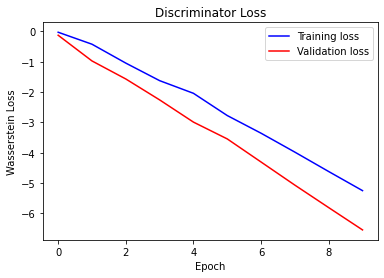

  1%|          | 11/1000 [00:14<15:21,  1.07it/s]
Epoch 11:

Generator training loss: -1.3696341287522087
Discriminator training loss: -5.845260211399624

Generator validation loss: -1.264245092868805
Discriminator validation loss: -7.3079878602709085
  1%|          | 12/1000 [00:14<13:36,  1.21it/s]
Epoch 12:

Generator training loss: -1.795973153341384
Discriminator training loss: -6.586835770379929

Generator validation loss: -1.3867691499846322
Discriminator validation loss: -8.120027201516288
  1%|▏         | 13/1000 [00:15<12:31,  1.31it/s]
Epoch 13:

Generator training loss: -3.3176788545790172
Discriminator training loss: -7.265183675856818

Generator validation loss: -1.5886807356561934
Discriminator validation loss: -8.854008538382393
  1%|▏         | 14/1000 [00:16<11:41,  1.41it/s]
Epoch 14:

Generator training loss: -1.4737461578278315
Discriminator training loss: -7.967905214854651

Generator validation loss: -1.7103565420423237
Discriminator validation loss: -9.664900302

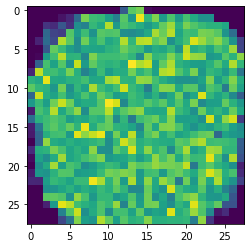

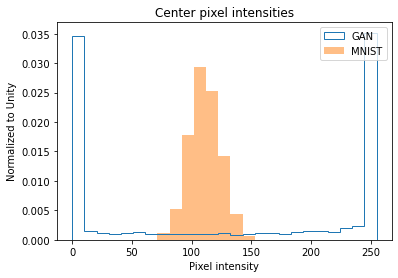

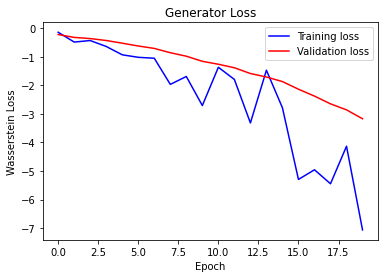

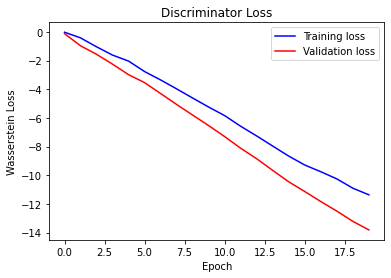

  2%|▏         | 21/1000 [00:21<13:16,  1.23it/s]
Epoch 21:

Generator training loss: -4.8420123259226475
Discriminator training loss: -11.941608088357112

Generator validation loss: -3.422406230654035
Discriminator validation loss: -14.51707192829677
  2%|▏         | 22/1000 [00:21<12:30,  1.30it/s]
Epoch 22:

Generator training loss: -5.9147364752633225
Discriminator training loss: -12.462341444832944

Generator validation loss: -3.688737545694624
Discriminator validation loss: -15.102619852338519
  2%|▏         | 23/1000 [00:22<12:19,  1.32it/s]
Epoch 23:

Generator training loss: -3.881455659866333
Discriminator training loss: -12.978500661395843

Generator validation loss: -3.897651365825108
Discriminator validation loss: -15.742095129830497
  2%|▏         | 24/1000 [00:23<11:55,  1.36it/s]
Epoch 24:

Generator training loss: -6.653870060330346
Discriminator training loss: -13.473510015578496

Generator validation loss: -4.158469302313668
Discriminator validation loss: -16.3185961

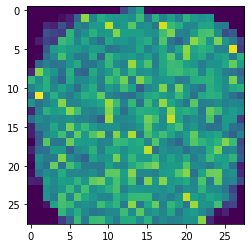

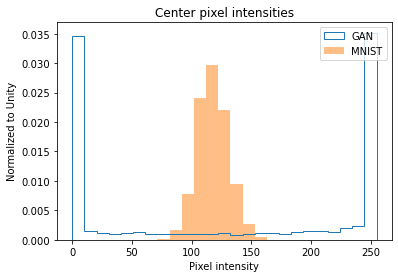

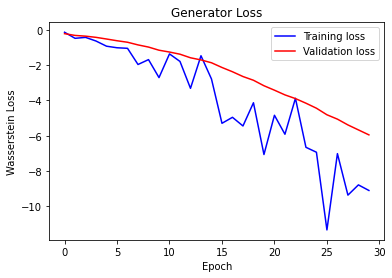

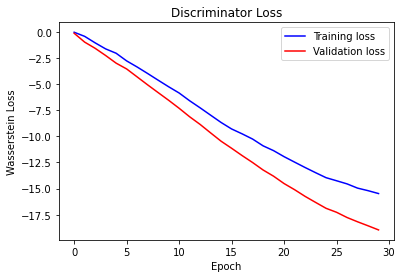

  3%|▎         | 31/1000 [00:28<13:40,  1.18it/s]
Epoch 31:

Generator training loss: -8.342598052251907
Discriminator training loss: -15.75595176787604

Generator validation loss: -6.193203585488456
Discriminator validation loss: -19.249358994620184
  3%|▎         | 32/1000 [00:29<12:38,  1.28it/s]
Epoch 32:

Generator training loss: -13.672102405911401
Discriminator training loss: -15.904623871757869

Generator validation loss: -6.551944358008249
Discriminator validation loss: -19.47766235896519
  3%|▎         | 33/1000 [00:30<12:02,  1.34it/s]
Epoch 33:

Generator training loss: -14.357477710360572
Discriminator training loss: -15.979410943530855

Generator validation loss: -6.924963678632463
Discriminator validation loss: -19.64750943865095
  3%|▎         | 34/1000 [00:30<11:18,  1.42it/s]
Epoch 34:

Generator training loss: -10.870847361428398
Discriminator training loss: -16.153580869947163

Generator validation loss: -7.1621629851205
Discriminator validation loss: -19.8737297058

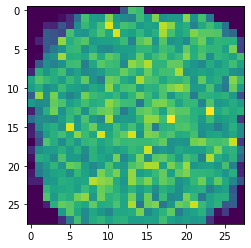

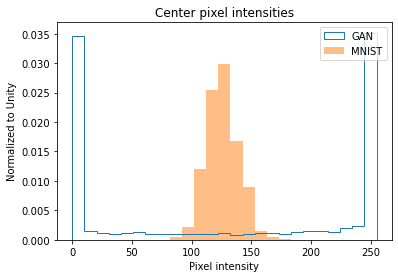

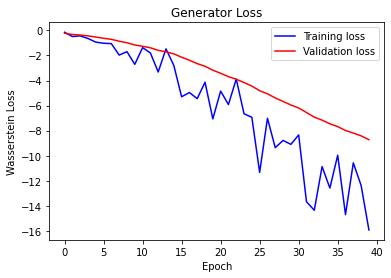

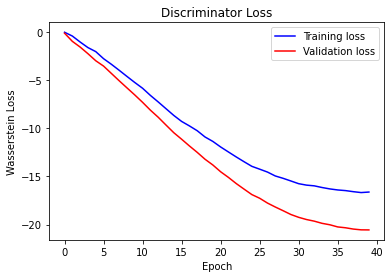

  4%|▍         | 41/1000 [00:36<14:13,  1.12it/s]
Epoch 41:

Generator training loss: -12.885731401897612
Discriminator training loss: -16.698229335603262

Generator validation loss: -8.93240179334368
Discriminator validation loss: -20.599204880850657
  4%|▍         | 42/1000 [00:37<14:01,  1.14it/s]
Epoch 42:

Generator training loss: -19.91367771511986
Discriminator training loss: -16.620394207182382

Generator validation loss: -9.308639322008407
Discriminator validation loss: -20.45366450718471
  4%|▍         | 43/1000 [00:38<13:24,  1.19it/s]
Epoch 43:

Generator training loss: -18.787581693558465
Discriminator training loss: -16.381994883219402

Generator validation loss: -9.592732565743583
Discriminator validation loss: -20.34805461338588
  4%|▍         | 44/1000 [00:38<13:07,  1.21it/s]
Epoch 44:

Generator training loss: -21.07937177022298
Discriminator training loss: -16.31730129605248

Generator validation loss: -9.952223573412216
Discriminator validation loss: -20.1657079969

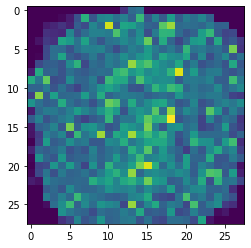

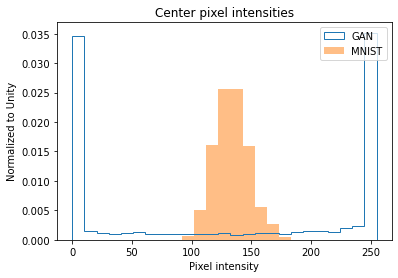

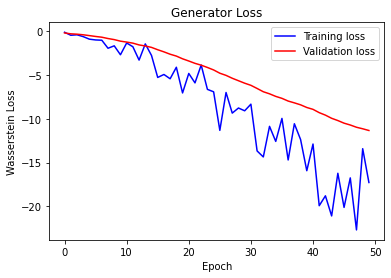

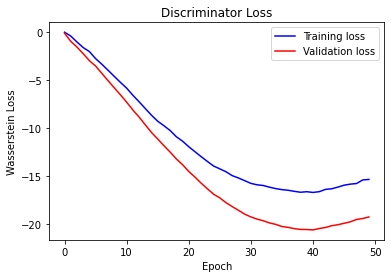

  5%|▌         | 51/1000 [00:44<14:54,  1.06it/s]
Epoch 51:

Generator training loss: -13.592316082545691
Discriminator training loss: -15.39555075055077

Generator validation loss: -11.494824000767302
Discriminator validation loss: -19.128727095467703
  5%|▌         | 52/1000 [00:45<14:27,  1.09it/s]
Epoch 52:

Generator training loss: -17.528772354125977
Discriminator training loss: -15.249664352053689

Generator validation loss: -11.636296272277834
Discriminator validation loss: -18.94655622754778
  5%|▌         | 53/1000 [00:46<13:37,  1.16it/s]
Epoch 53:

Generator training loss: -25.825700078691753
Discriminator training loss: -14.871942134130565

Generator validation loss: -11.939471312931605
Discriminator validation loss: -18.621679306030273
  5%|▌         | 54/1000 [00:47<12:16,  1.29it/s]
Epoch 54:

Generator training loss: -4.044975326174781
Discriminator training loss: -14.853365920838858

Generator validation loss: -11.849288531712125
Discriminator validation loss: -18.651

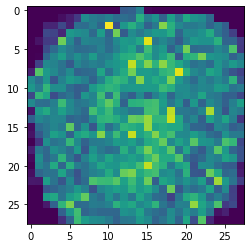

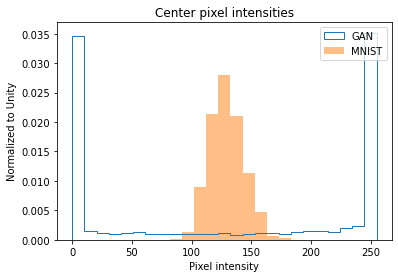

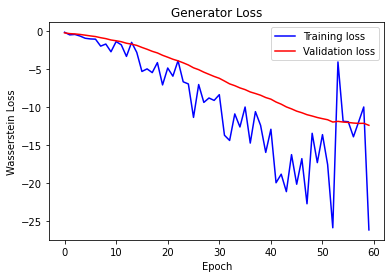

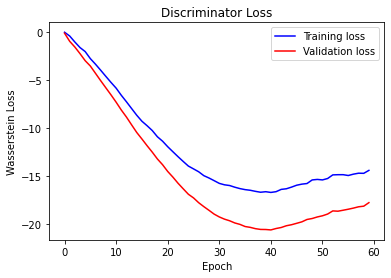

  6%|▌         | 61/1000 [00:52<15:01,  1.04it/s]
Epoch 61:

Generator training loss: -22.12105251493908
Discriminator training loss: -14.093956606728684

Generator validation loss: -12.567270142691477
Discriminator validation loss: -17.43914004734584
  6%|▌         | 62/1000 [00:53<14:14,  1.10it/s]
Epoch 62:

Generator training loss: -10.067306473141624
Discriminator training loss: -14.00709022794451

Generator validation loss: -12.568858759743826
Discriminator validation loss: -17.29158251626151
  6%|▋         | 63/1000 [00:54<13:35,  1.15it/s]
Epoch 63:

Generator training loss: -18.13830466497512
Discriminator training loss: -13.81981188910348

Generator validation loss: -12.68608318056379
Discriminator validation loss: -17.091650826590403
  6%|▋         | 64/1000 [00:55<12:40,  1.23it/s]
Epoch 64:

Generator training loss: -10.110798109145392
Discriminator training loss: -13.735451312292186

Generator validation loss: -12.69279841014317
Discriminator validation loss: -16.93046746

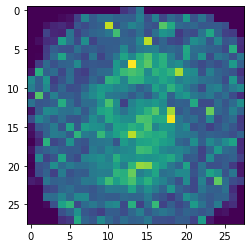

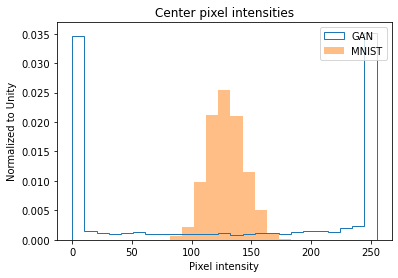

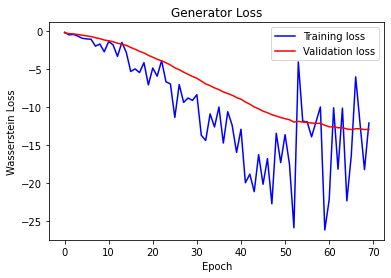

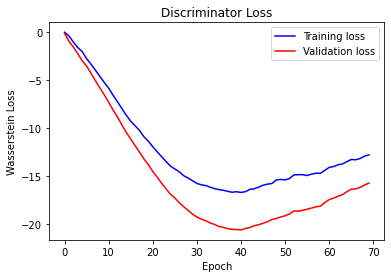

  7%|▋         | 71/1000 [01:00<13:43,  1.13it/s]
Epoch 71:

Generator training loss: -16.07106821877616
Discriminator training loss: -12.61047140757243

Generator validation loss: -12.947073663984028
Discriminator validation loss: -15.486168588910784
  7%|▋         | 72/1000 [01:01<13:06,  1.18it/s]
Epoch 72:

Generator training loss: -16.12636679694766
Discriminator training loss: -12.365376858484177

Generator validation loss: -12.974317482539588
Discriminator validation loss: -15.27847419466291
  7%|▋         | 73/1000 [01:02<12:13,  1.26it/s]
Epoch 73:

Generator training loss: -18.057227361769904
Discriminator training loss: -12.076960291181292

Generator validation loss: -13.046260561261857
Discriminator validation loss: -14.951042243412566
  7%|▋         | 74/1000 [01:02<11:27,  1.35it/s]
Epoch 74:

Generator training loss: -20.292920158022923
Discriminator training loss: -11.596145834241595

Generator validation loss: -13.097861289978026
Discriminator validation loss: -14.4694

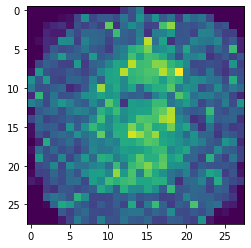

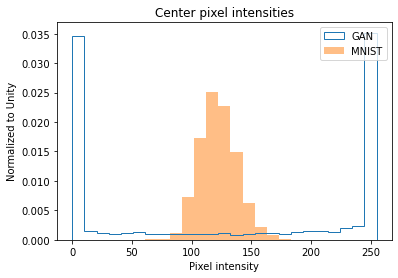

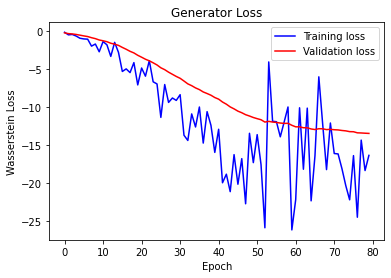

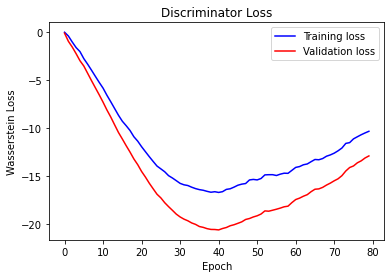

  8%|▊         | 81/1000 [01:08<13:36,  1.13it/s]
Epoch 81:

Generator training loss: -8.13670862288702
Discriminator training loss: -10.2380321820577

Generator validation loss: -13.363866669791086
Discriminator validation loss: -12.763877528054374
  8%|▊         | 82/1000 [01:09<12:34,  1.22it/s]
Epoch 82:

Generator training loss: -20.182134537469768
Discriminator training loss: -10.101257437751405

Generator validation loss: -13.450416769300187
Discriminator validation loss: -12.49415969848633
  8%|▊         | 83/1000 [01:09<11:50,  1.29it/s]
Epoch 83:

Generator training loss: -14.186697687421526
Discriminator training loss: -9.972076892852785

Generator validation loss: -13.483620916094099
Discriminator validation loss: -12.289341926574707
  8%|▊         | 84/1000 [01:10<11:24,  1.34it/s]
Epoch 84:

Generator training loss: -16.139079275585356
Discriminator training loss: -9.838282176426478

Generator validation loss: -13.561977658952983
Discriminator validation loss: -12.0551580

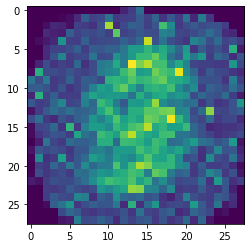

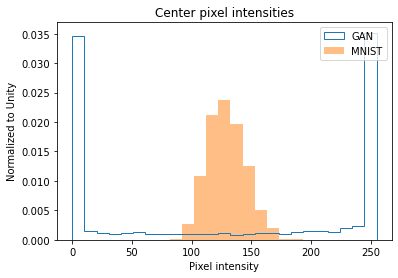

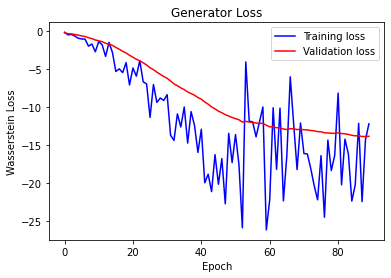

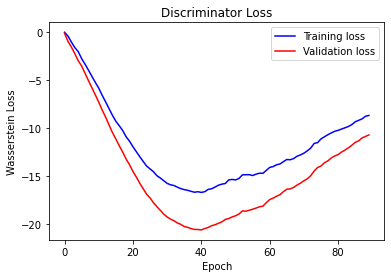

  9%|▉         | 91/1000 [01:16<13:40,  1.11it/s]
Epoch 91:

Generator training loss: -20.333499908447266
Discriminator training loss: -8.45981594494411

Generator validation loss: -13.893479687826975
Discriminator validation loss: -10.450818743024554
  9%|▉         | 92/1000 [01:16<12:37,  1.20it/s]
Epoch 92:

Generator training loss: -20.22257418859573
Discriminator training loss: -8.331312293098087

Generator validation loss: -13.94440371649606
Discriminator validation loss: -10.177358082362586
  9%|▉         | 93/1000 [01:17<11:55,  1.27it/s]
Epoch 93:

Generator training loss: -18.216020266215004
Discriminator training loss: -8.073822702680317

Generator validation loss: -13.980134623391288
Discriminator validation loss: -9.984556674957275
  9%|▉         | 94/1000 [01:18<11:11,  1.35it/s]
Epoch 94:

Generator training loss: -11.973577681041899
Discriminator training loss: -7.871933153697423

Generator validation loss: -13.902480806623185
Discriminator validation loss: -9.816628251

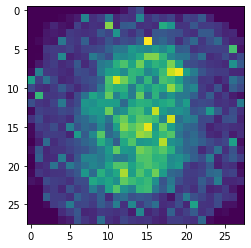

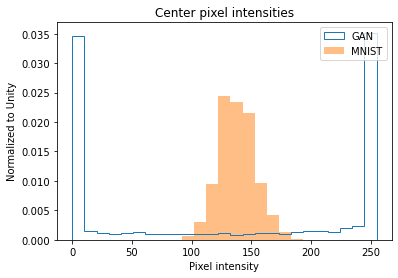

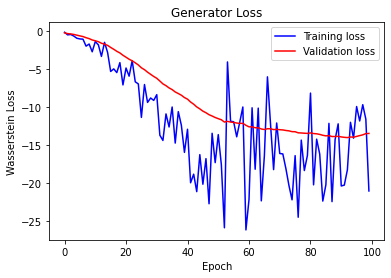

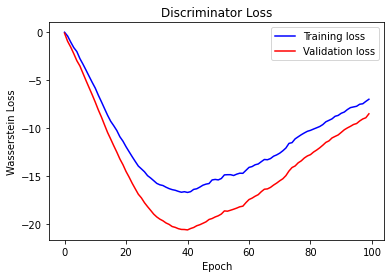

 10%|█         | 101/1000 [01:24<14:42,  1.02it/s]
Epoch 101:

Generator training loss: -13.260173457009452
Discriminator training loss: -6.622620253335861

Generator validation loss: -13.308344432285853
Discriminator validation loss: -8.392028910773142
 10%|█         | 102/1000 [01:25<13:29,  1.11it/s]
Epoch 102:

Generator training loss: -18.634591216132755
Discriminator training loss: -6.590240081151324

Generator validation loss: -13.26582132066999
Discriminator validation loss: -8.139880112239291
 10%|█         | 103/1000 [01:25<12:12,  1.23it/s]
Epoch 103:

Generator training loss: -12.923341024489629
Discriminator training loss: -6.097178777058919

Generator validation loss: -13.082563945225306
Discriminator validation loss: -7.930593184062413
 10%|█         | 104/1000 [01:26<11:24,  1.31it/s]
Epoch 104:

Generator training loss: -20.190949667067756
Discriminator training loss: -5.917821997687932

Generator validation loss: -13.00029645647321
Discriminator validation loss: -7.83

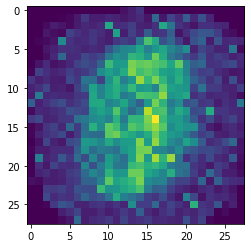

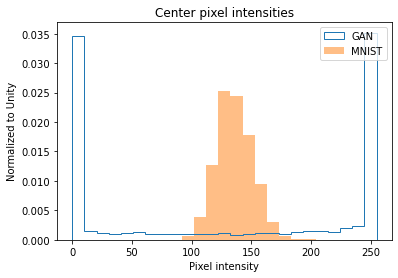

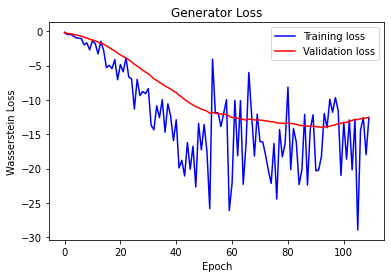

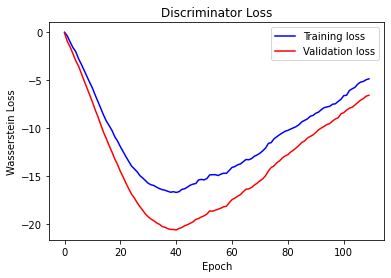

 11%|█         | 111/1000 [01:31<13:44,  1.08it/s]
Epoch 111:

Generator training loss: -14.247701962788899
Discriminator training loss: -4.744822547549292

Generator validation loss: -12.550726209368024
Discriminator validation loss: -6.5596319266727985
 11%|█         | 112/1000 [01:32<12:28,  1.19it/s]
Epoch 112:

Generator training loss: -10.697335742768786
Discriminator training loss: -4.679103317714872

Generator validation loss: -12.508679185594833
Discriminator validation loss: -6.475323063986642
 11%|█▏        | 113/1000 [01:33<11:27,  1.29it/s]
Epoch 113:

Generator training loss: -16.011429854801722
Discriminator training loss: -4.731657459622339

Generator validation loss: -12.583416053227014
Discriminator validation loss: -6.41703758920942
 11%|█▏        | 114/1000 [01:33<10:53,  1.36it/s]
Epoch 114:

Generator training loss: -16.04810839607602
Discriminator training loss: -4.573261113393874

Generator validation loss: -12.675351687840054
Discriminator validation loss: -6.2

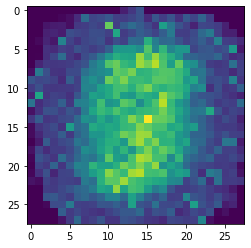

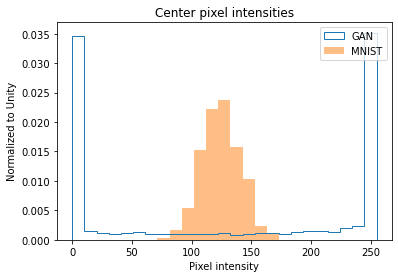

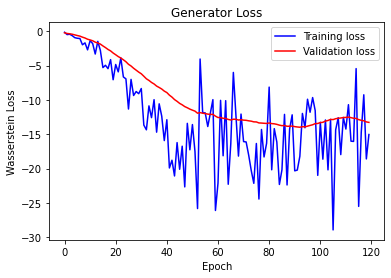

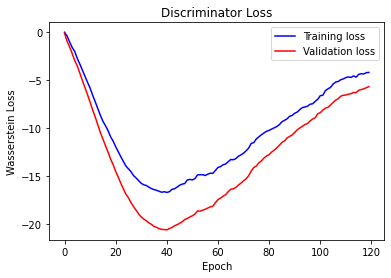

 12%|█▏        | 121/1000 [01:39<11:59,  1.22it/s]
Epoch 121:

Generator training loss: -18.93507355735416
Discriminator training loss: -4.088252595492772

Generator validation loss: -13.346219403403147
Discriminator validation loss: -5.533296585083008
 12%|█▏        | 122/1000 [01:39<10:58,  1.33it/s]
Epoch 122:

Generator training loss: -13.257577192215692
Discriminator training loss: -4.036153742245266

Generator validation loss: -13.373956816537039
Discriminator validation loss: -5.465162311281477
 12%|█▏        | 123/1000 [01:40<10:21,  1.41it/s]
Epoch 123:

Generator training loss: -11.382568109603156
Discriminator training loss: -3.927764994757517

Generator validation loss: -13.419316019330706
Discriminator validation loss: -5.365134647914342
 12%|█▏        | 124/1000 [01:40<09:53,  1.48it/s]
Epoch 124:

Generator training loss: -13.424124717712402
Discriminator training loss: -3.8231610513868786

Generator validation loss: -13.50508751188006
Discriminator validation loss: -5.2

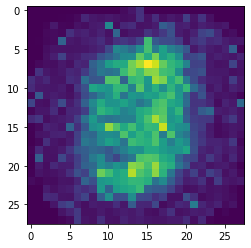

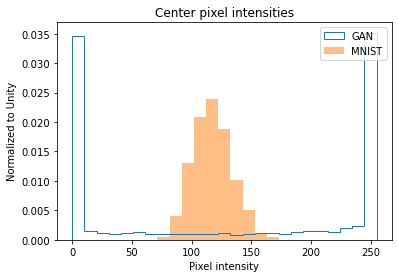

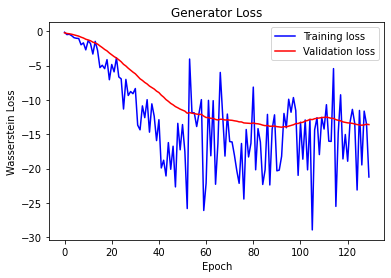

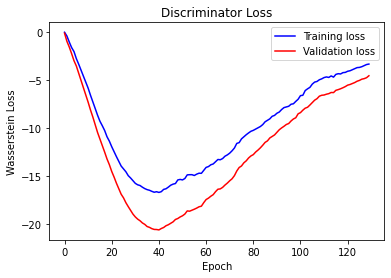

 13%|█▎        | 131/1000 [01:46<12:50,  1.13it/s]
Epoch 131:

Generator training loss: -19.306554113115585
Discriminator training loss: -3.2639979010536564

Generator validation loss: -13.66731541497367
Discriminator validation loss: -4.46449875831604
 13%|█▎        | 132/1000 [01:47<11:37,  1.24it/s]
Epoch 132:

Generator training loss: -13.412146681830997
Discriminator training loss: -3.054364124933878

Generator validation loss: -13.592046056474956
Discriminator validation loss: -4.404255151748657
 13%|█▎        | 133/1000 [01:47<10:38,  1.36it/s]
Epoch 133:

Generator training loss: -21.11840236754644
Discriminator training loss: -2.976402680079142

Generator validation loss: -13.561998162950786
Discriminator validation loss: -4.243278707776752
 13%|█▎        | 134/1000 [01:48<10:13,  1.41it/s]
Epoch 134:

Generator training loss: -21.118659291948592
Discriminator training loss: -2.9189816883632114

Generator validation loss: -13.515426908220563
Discriminator validation loss: -4.1

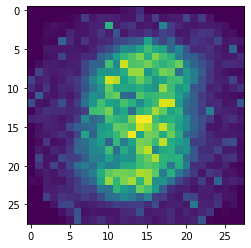

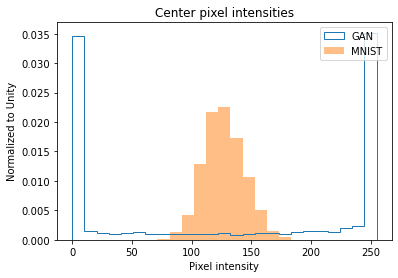

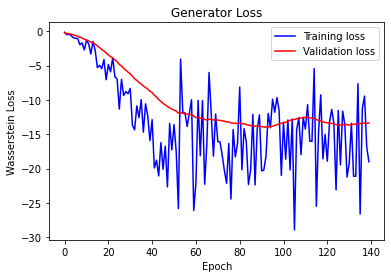

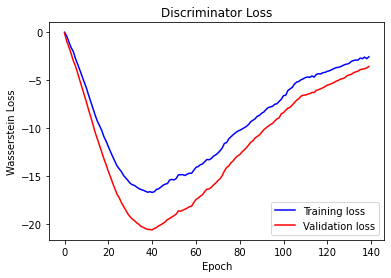

 14%|█▍        | 141/1000 [01:54<13:12,  1.08it/s]
Epoch 141:

Generator training loss: -16.946264675685338
Discriminator training loss: -2.575602764175052

Generator validation loss: -13.41046551295689
Discriminator validation loss: -3.5424956253596713
 14%|█▍        | 142/1000 [01:54<12:33,  1.14it/s]
Epoch 142:

Generator training loss: -15.053152810959588
Discriminator training loss: -2.3580700811885653

Generator validation loss: -13.378633975982664
Discriminator validation loss: -3.470709136554173
 14%|█▍        | 143/1000 [01:55<11:50,  1.21it/s]
Epoch 143:

Generator training loss: -9.450099808829172
Discriminator training loss: -2.4074882183756148

Generator validation loss: -13.29537664140974
Discriminator validation loss: -3.433348843029567
 14%|█▍        | 144/1000 [01:56<11:10,  1.28it/s]
Epoch 144:

Generator training loss: -18.803258736928303
Discriminator training loss: -2.206156594412667

Generator validation loss: -13.267372540065223
Discriminator validation loss: -3.

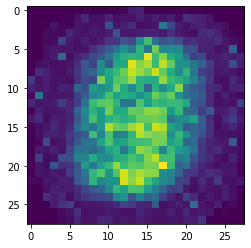

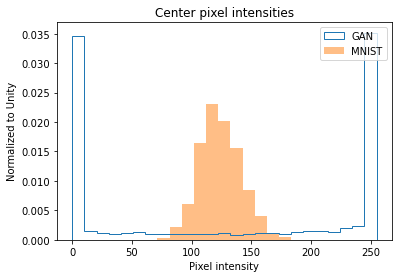

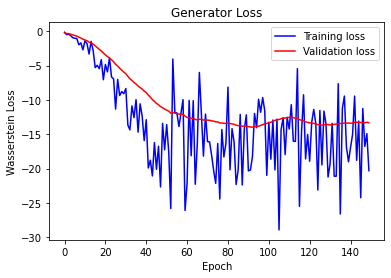

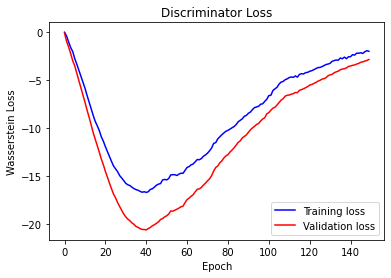

 15%|█▌        | 151/1000 [02:02<13:10,  1.07it/s]
Epoch 151:

Generator training loss: -14.901967502775646
Discriminator training loss: -1.9036801258722935

Generator validation loss: -13.340151854923793
Discriminator validation loss: -2.838343415941511
 15%|█▌        | 152/1000 [02:02<12:04,  1.17it/s]
Epoch 152:

Generator training loss: -16.887902191707067
Discriminator training loss: -1.8429360588391621

Generator validation loss: -13.336138793400355
Discriminator validation loss: -2.794275522232056
 15%|█▌        | 153/1000 [02:03<11:10,  1.26it/s]
Epoch 153:

Generator training loss: -14.959938072022938
Discriminator training loss: -1.8568168992087957

Generator validation loss: -13.364289692470003
Discriminator validation loss: -2.742454034941537
 15%|█▌        | 154/1000 [02:04<10:45,  1.31it/s]
Epoch 154:

Generator training loss: -14.95741128921509
Discriminator training loss: -1.833839822383154

Generator validation loss: -13.348691395350864
Discriminator validation loss: -

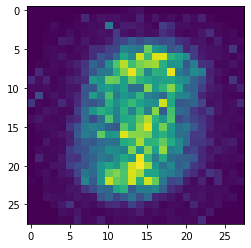

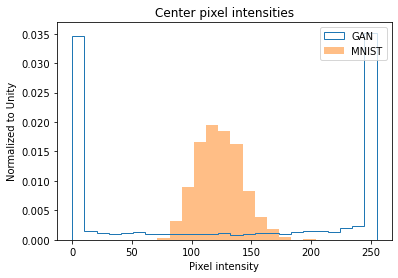

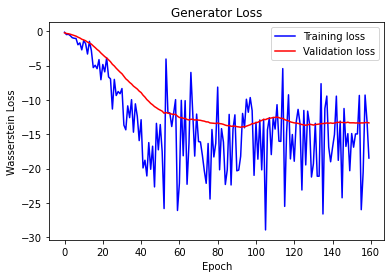

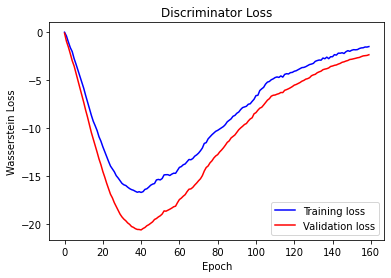

 16%|█▌        | 161/1000 [02:10<13:56,  1.00it/s]
Epoch 161:

Generator training loss: -16.754845891680034
Discriminator training loss: -1.4594228579884485

Generator validation loss: -13.3116261618478
Discriminator validation loss: -2.3183348519461497
 16%|█▌        | 162/1000 [02:11<13:07,  1.06it/s]
Epoch 162:

Generator training loss: -18.54585556756882
Discriminator training loss: -1.3962852060794828

Generator validation loss: -13.364928654262
Discriminator validation loss: -2.2683708667755127
 16%|█▋        | 163/1000 [02:12<12:54,  1.08it/s]
Epoch 163:

Generator training loss: -16.725158464340936
Discriminator training loss: -1.3562313034420919

Generator validation loss: -13.346670559474399
Discriminator validation loss: -2.212795853614807
 16%|█▋        | 164/1000 [02:12<11:37,  1.20it/s]
Epoch 164:

Generator training loss: -9.2441987991333
Discriminator training loss: -1.4417754099482583

Generator validation loss: -13.353806904384069
Discriminator validation loss: -2.201

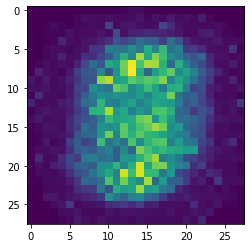

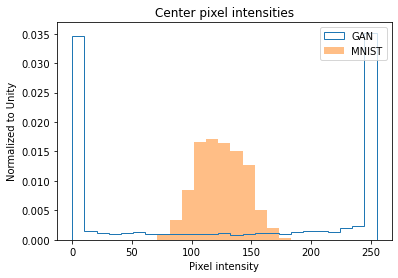

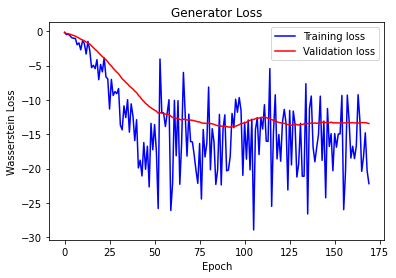

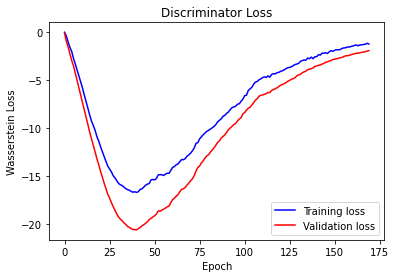

 17%|█▋        | 171/1000 [02:18<12:04,  1.15it/s]
Epoch 171:

Generator training loss: -11.229775179000129
Discriminator training loss: -1.129946992510841

Generator validation loss: -13.360254015241349
Discriminator validation loss: -1.93022654737745
 17%|█▋        | 172/1000 [02:19<10:47,  1.28it/s]
Epoch 172:

Generator training loss: -16.653859047662642
Discriminator training loss: -1.1380416467076253

Generator validation loss: -13.404828684670584
Discriminator validation loss: -1.8970225708825248
 17%|█▋        | 173/1000 [02:19<10:14,  1.35it/s]
Epoch 173:

Generator training loss: -20.262724672045028
Discriminator training loss: -1.1340340134643372

Generator validation loss: -13.411449909210205
Discriminator validation loss: -1.8552001118659978
 17%|█▋        | 174/1000 [02:20<09:38,  1.43it/s]
Epoch 174:

Generator training loss: -14.828959419613795
Discriminator training loss: -1.0645614798579899

Generator validation loss: -13.34128155027117
Discriminator validation loss: 

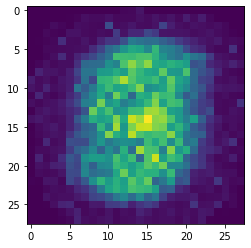

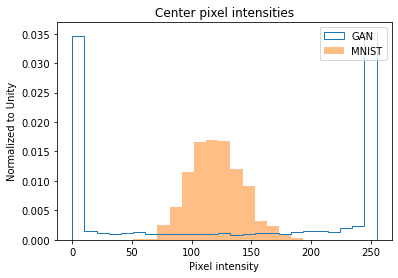

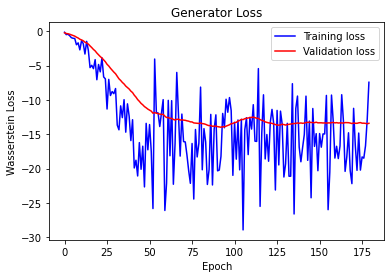

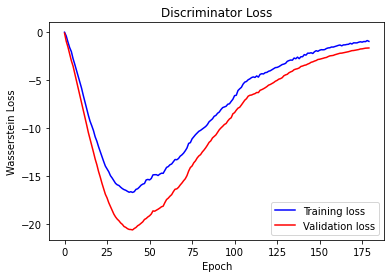

 18%|█▊        | 181/1000 [02:25<11:10,  1.22it/s]
Epoch 181:

Generator training loss: -14.77198952720279
Discriminator training loss: -1.073547678334372

Generator validation loss: -13.444300651550293
Discriminator validation loss: -1.6525133592741832
 18%|█▊        | 182/1000 [02:26<10:18,  1.32it/s]
Epoch 182:

Generator training loss: -11.083773431323822
Discriminator training loss: -0.9002317225649242

Generator validation loss: -13.42183188029698
Discriminator validation loss: -1.6272533791405814
 18%|█▊        | 183/1000 [02:26<09:37,  1.41it/s]
Epoch 183:

Generator training loss: -11.098201274871826
Discriminator training loss: -0.9135124168935276

Generator validation loss: -13.44504281452724
Discriminator validation loss: -1.6120901618685042
 18%|█▊        | 184/1000 [02:27<09:07,  1.49it/s]
Epoch 184:

Generator training loss: -22.02925103051322
Discriminator training loss: -0.9023756760926472

Generator validation loss: -13.38788196018764
Discriminator validation loss: -1

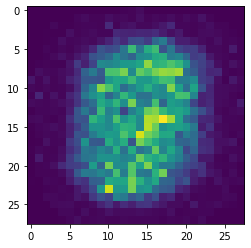

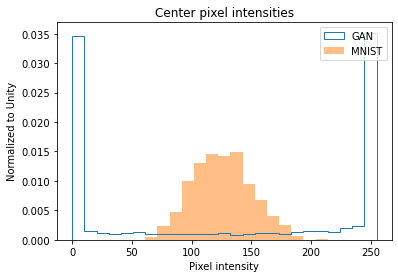

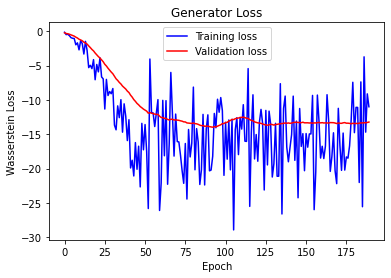

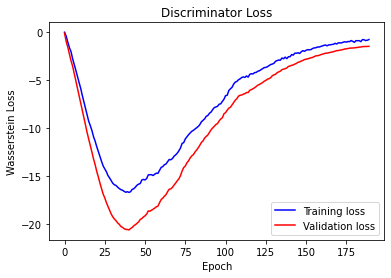

 19%|█▉        | 191/1000 [02:32<11:21,  1.19it/s]
Epoch 191:

Generator training loss: -16.276491028921946
Discriminator training loss: -0.7353533795546917

Generator validation loss: -13.227065086364746
Discriminator validation loss: -1.4667681029864716
 19%|█▉        | 192/1000 [02:33<10:45,  1.25it/s]
Epoch 192:

Generator training loss: -5.384171576727004
Discriminator training loss: -0.7593730327983697

Generator validation loss: -13.183168683733257
Discriminator validation loss: -1.4801686406135561
 19%|█▉        | 193/1000 [02:33<10:15,  1.31it/s]
Epoch 193:

Generator training loss: -16.268979140690394
Discriminator training loss: -0.7656232317288714

Generator validation loss: -13.160333156585692
Discriminator validation loss: -1.4476581641605921
 19%|█▉        | 194/1000 [02:34<10:05,  1.33it/s]
Epoch 194:

Generator training loss: -17.996057896387008
Discriminator training loss: -0.7188990731235769

Generator validation loss: -13.219048908778598
Discriminator validation los

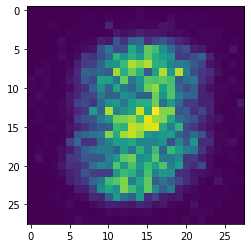

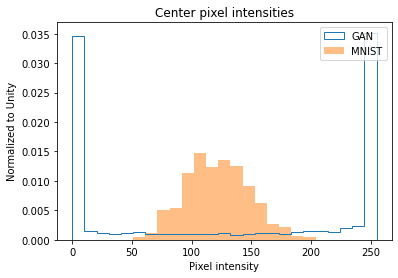

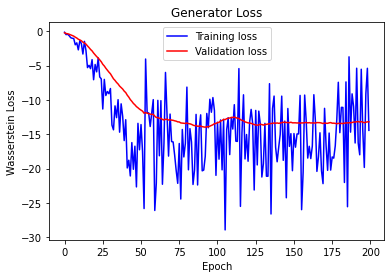

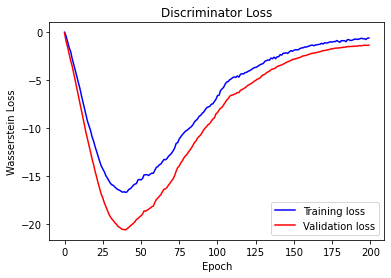

 20%|██        | 201/1000 [02:40<12:59,  1.03it/s]
Epoch 201:

Generator training loss: -21.517774831681024
Discriminator training loss: -0.7312998069184166

Generator validation loss: -13.254269463675366
Discriminator validation loss: -1.342815637588501
 20%|██        | 202/1000 [02:41<11:53,  1.12it/s]
Epoch 202:

Generator training loss: -12.53270637421381
Discriminator training loss: -0.7330943750483648

Generator validation loss: -13.273896012987409
Discriminator validation loss: -1.331137844494411
 20%|██        | 203/1000 [02:42<11:09,  1.19it/s]
Epoch 203:

Generator training loss: -17.84473146711077
Discriminator training loss: -0.5703515293786213

Generator validation loss: -13.273223468235562
Discriminator validation loss: -1.2994079760142736
 20%|██        | 204/1000 [02:42<10:27,  1.27it/s]
Epoch 204:

Generator training loss: -16.189146950131374
Discriminator training loss: -0.6282641917821903

Generator validation loss: -13.305020400456021
Discriminator validation loss: 

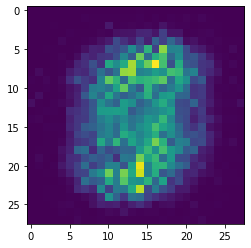

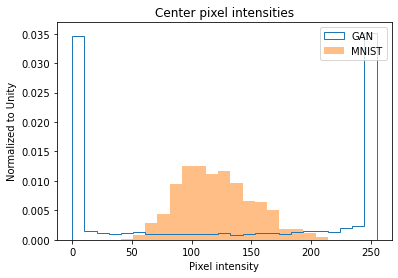

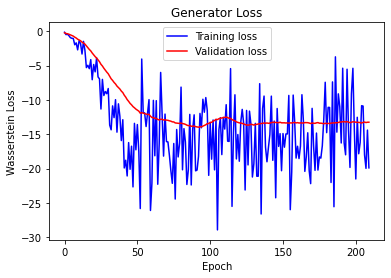

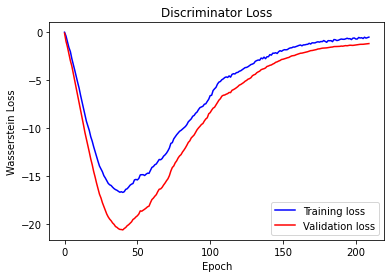

 21%|██        | 211/1000 [02:48<12:43,  1.03it/s]
Epoch 211:

Generator training loss: -9.020648229689826
Discriminator training loss: -0.5083410037415368

Generator validation loss: -13.24153348377773
Discriminator validation loss: -1.2023062961442132
 21%|██        | 212/1000 [02:49<11:44,  1.12it/s]
Epoch 212:

Generator training loss: -16.11226161321004
Discriminator training loss: -0.5353260904195762

Generator validation loss: -13.228821005140029
Discriminator validation loss: -1.1763388344219752
 21%|██▏       | 213/1000 [02:50<11:34,  1.13it/s]
Epoch 213:

Generator training loss: -14.153701123737155
Discriminator training loss: -0.4936926749845347

Generator validation loss: -13.238780839102608
Discriminator validation loss: -1.1731518762452262
 21%|██▏       | 214/1000 [02:51<10:46,  1.22it/s]
Epoch 214:

Generator training loss: -14.211073489416213
Discriminator training loss: -0.5376340612059547

Generator validation loss: -13.207813807896207
Discriminator validation loss:

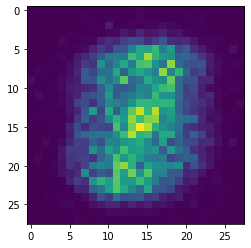

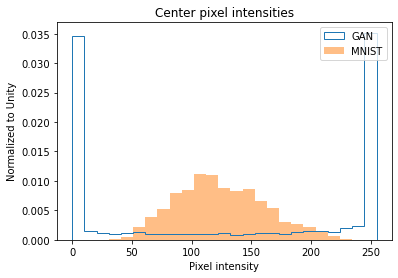

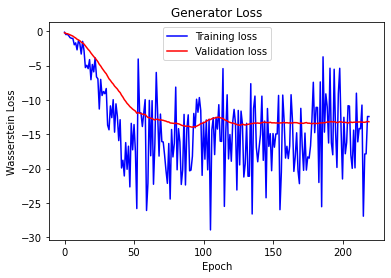

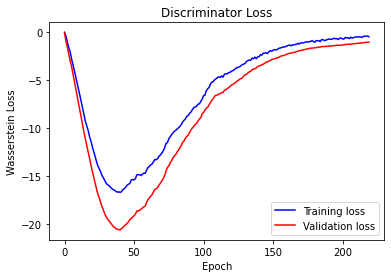

 22%|██▏       | 221/1000 [02:58<14:49,  1.14s/it]
Epoch 221:

Generator training loss: -12.46935254051572
Discriminator training loss: -0.39173395231011365

Generator validation loss: -13.187655993870326
Discriminator validation loss: -1.0682466541017803
 22%|██▏       | 222/1000 [02:58<13:23,  1.03s/it]
Epoch 222:

Generator training loss: -12.308557714734759
Discriminator training loss: -0.4649822737666823

Generator validation loss: -13.136944430215017
Discriminator validation loss: -1.0553349937711443
 22%|██▏       | 223/1000 [02:59<11:57,  1.08it/s]
Epoch 223:

Generator training loss: -10.68113747097197
Discriminator training loss: -0.38408059564729535

Generator validation loss: -13.129574911934988
Discriminator validation loss: -1.053596087864467
 22%|██▏       | 224/1000 [03:00<10:52,  1.19it/s]
Epoch 224:

Generator training loss: -15.963589577447799
Discriminator training loss: -0.49961955384129564

Generator validation loss: -13.09963355745588
Discriminator validation los

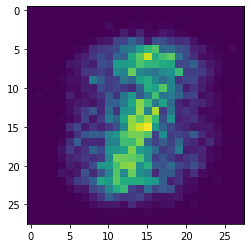

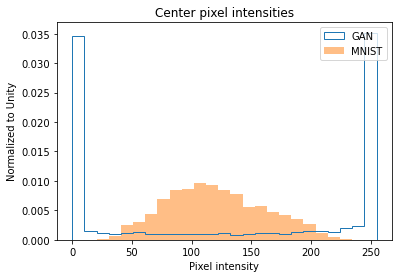

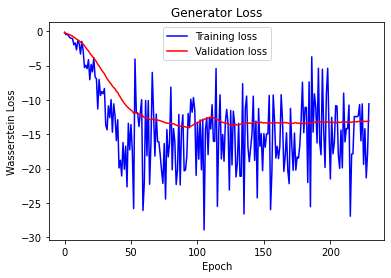

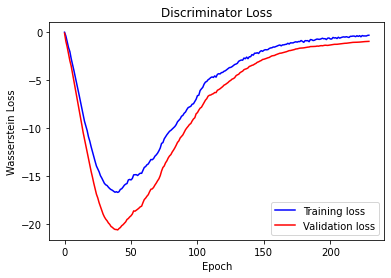

 23%|██▎       | 231/1000 [03:06<12:57,  1.01s/it]
Epoch 231:

Generator training loss: -6.976386024838401
Discriminator training loss: -0.33851454176363494

Generator validation loss: -13.004923820495605
Discriminator validation loss: -0.972053519317082
 23%|██▎       | 232/1000 [03:07<12:14,  1.04it/s]
Epoch 232:

Generator training loss: -8.774536677769252
Discriminator training loss: -0.4464886728674172

Generator validation loss: -13.076456206185478
Discriminator validation loss: -0.9790069120270866
 23%|██▎       | 233/1000 [03:08<11:43,  1.09it/s]
Epoch 233:

Generator training loss: -14.031620820363361
Discriminator training loss: -0.382898982933035

Generator validation loss: -13.004478727068221
Discriminator validation loss: -0.9683825501373837
 23%|██▎       | 234/1000 [03:08<10:52,  1.17it/s]
Epoch 234:

Generator training loss: -13.986229555947443
Discriminator training loss: -0.4053320245196423

Generator validation loss: -13.021568093981063
Discriminator validation loss:

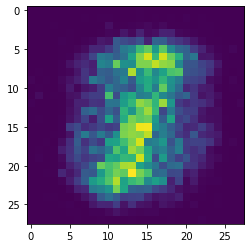

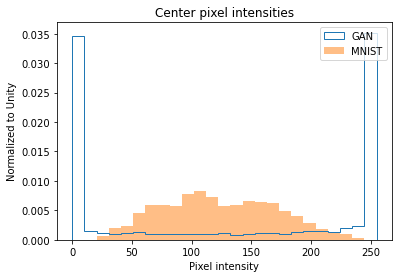

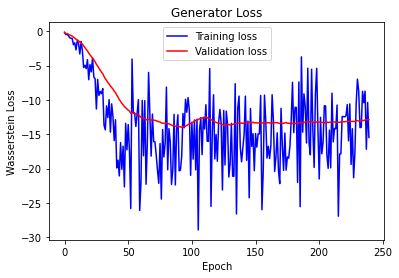

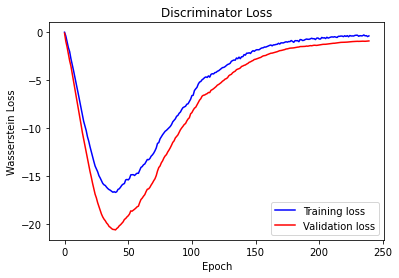

 24%|██▍       | 241/1000 [03:15<12:59,  1.03s/it]
Epoch 241:

Generator training loss: -13.633139019920712
Discriminator training loss: -0.3108081978612713

Generator validation loss: -12.752364771706718
Discriminator validation loss: -0.9348797968455723
 24%|██▍       | 242/1000 [03:15<11:27,  1.10it/s]
Epoch 242:

Generator training loss: -18.683305694943382
Discriminator training loss: -0.4161976727745718

Generator validation loss: -12.778263977595737
Discriminator validation loss: -0.9028111738818032
 24%|██▍       | 243/1000 [03:16<10:44,  1.18it/s]
Epoch 243:

Generator training loss: -17.214057331993466
Discriminator training loss: -0.4305679427371137

Generator validation loss: -12.791699750082833
Discriminator validation loss: -0.8912561748708997
 24%|██▍       | 244/1000 [03:17<10:10,  1.24it/s]
Epoch 244:

Generator training loss: -12.033141113462902
Discriminator training loss: -0.23937322677478998

Generator validation loss: -12.651389598846436
Discriminator validation l

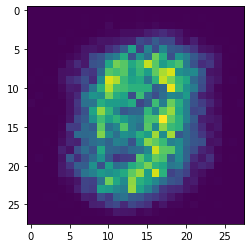

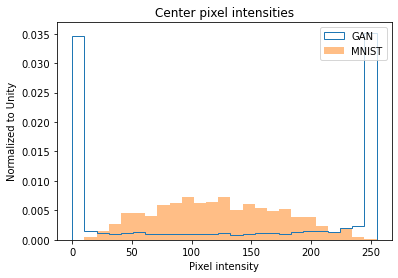

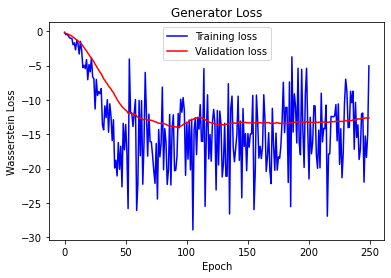

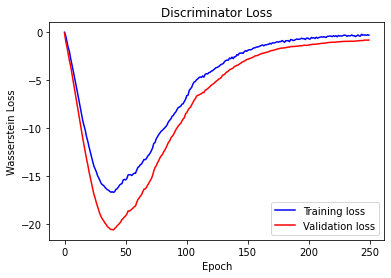

 25%|██▌       | 251/1000 [03:23<11:56,  1.05it/s]
Epoch 251:

Generator training loss: -16.924320516132173
Discriminator training loss: -0.26651911129288014

Generator validation loss: -12.681264332362584
Discriminator validation loss: -0.8294392355850765
 25%|██▌       | 252/1000 [03:23<10:45,  1.16it/s]
Epoch 252:

Generator training loss: -10.052414394560314
Discriminator training loss: -0.2907262589848999

Generator validation loss: -12.58383730479649
Discriminator validation loss: -0.8376868792942591
 25%|██▌       | 253/1000 [03:24<10:11,  1.22it/s]
Epoch 253:

Generator training loss: -18.277280103592645
Discriminator training loss: -0.3173898589752969

Generator validation loss: -12.587691170828682
Discriminator validation loss: -0.8164306581020356
 25%|██▌       | 254/1000 [03:25<09:42,  1.28it/s]
Epoch 254:

Generator training loss: -11.597316038040889
Discriminator training loss: -0.28356379368120715

Generator validation loss: -12.547913891928534
Discriminator validation l

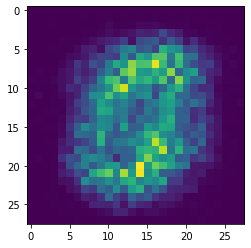

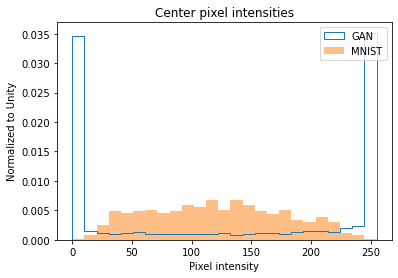

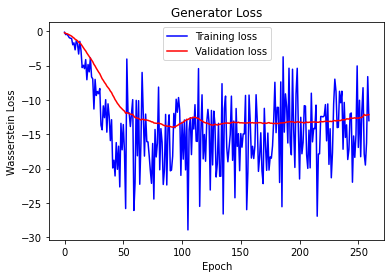

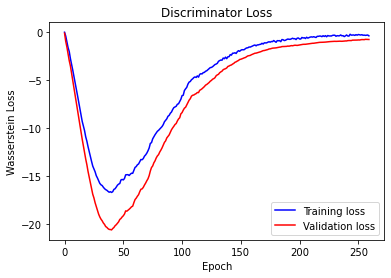

 26%|██▌       | 261/1000 [03:31<12:39,  1.03s/it]
Epoch 261:

Generator training loss: -14.54112143743606
Discriminator training loss: -0.3545691432608735

Generator validation loss: -12.138095038277761
Discriminator validation loss: -0.7668023109436035
 26%|██▌       | 262/1000 [03:32<11:52,  1.04it/s]
Epoch 262:

Generator training loss: -11.148881458100819
Discriminator training loss: -0.3008562109233546

Generator validation loss: -12.052496433258057
Discriminator validation loss: -0.7658560957227433
 26%|██▋       | 263/1000 [03:33<11:10,  1.10it/s]
Epoch 263:

Generator training loss: -14.45679153714861
Discriminator training loss: -0.3054117663719114

Generator validation loss: -12.005991527012416
Discriminator validation loss: -0.7623869861875262
 26%|██▋       | 264/1000 [03:33<10:39,  1.15it/s]
Epoch 264:

Generator training loss: -12.632267815726145
Discriminator training loss: -0.25959777534895

Generator validation loss: -11.934873853410991
Discriminator validation loss: 

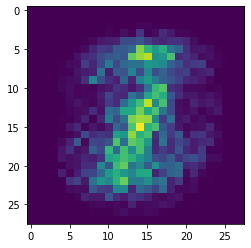

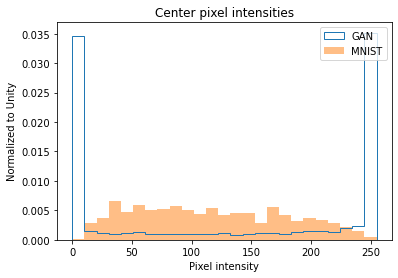

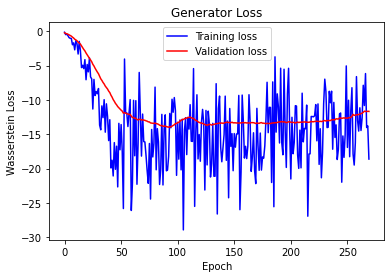

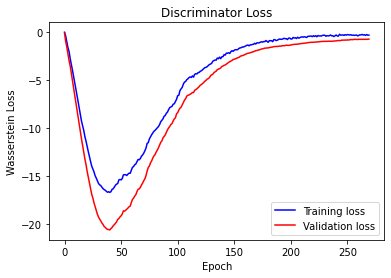

 27%|██▋       | 271/1000 [03:40<12:31,  1.03s/it]
Epoch 271:

Generator training loss: -17.13719572339739
Discriminator training loss: -0.3789781296980522

Generator validation loss: -11.73488167354039
Discriminator validation loss: -0.7298412791320257
 27%|██▋       | 272/1000 [03:41<11:11,  1.08it/s]
Epoch 272:

Generator training loss: -17.110575494312105
Discriminator training loss: -0.3649559217682552

Generator validation loss: -11.760421616690499
Discriminator validation loss: -0.721820511988231
 27%|██▋       | 273/1000 [03:41<10:37,  1.14it/s]
Epoch 273:

Generator training loss: -14.007011254628502
Discriminator training loss: -0.3416049366462087

Generator validation loss: -11.671395029340472
Discriminator validation loss: -0.7087218931743078
 27%|██▋       | 274/1000 [03:42<09:55,  1.22it/s]
Epoch 274:

Generator training loss: -9.249546527862549
Discriminator training loss: -0.3246321787259408

Generator validation loss: -11.658890996660505
Discriminator validation loss: 

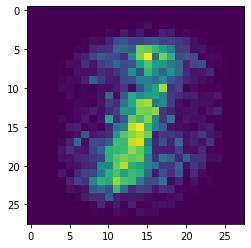

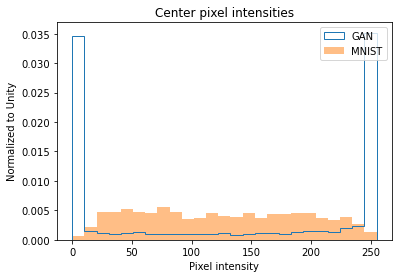

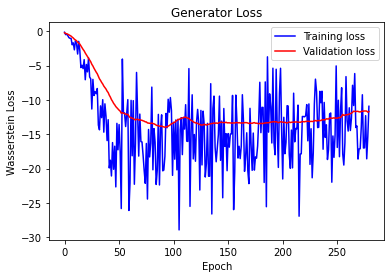

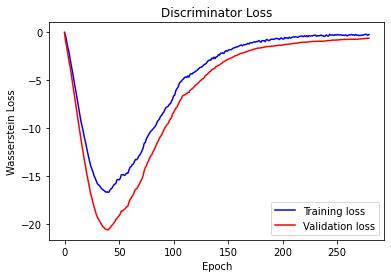

 28%|██▊       | 281/1000 [03:48<11:49,  1.01it/s]
Epoch 281:

Generator training loss: -10.68694795880999
Discriminator training loss: -0.20186277696241936

Generator validation loss: -11.587342943464007
Discriminator validation loss: -0.653067614351
 28%|██▊       | 282/1000 [03:49<10:42,  1.12it/s]
Epoch 282:

Generator training loss: -9.195336046673003
Discriminator training loss: -0.24858677582371805

Generator validation loss: -11.57877561024257
Discriminator validation loss: -0.6651900793824876
 28%|██▊       | 283/1000 [03:50<10:07,  1.18it/s]
Epoch 283:

Generator training loss: -12.279828843616304
Discriminator training loss: -0.31698716613685796

Generator validation loss: -11.522481237139022
Discriminator validation loss: -0.664943175656455
 28%|██▊       | 284/1000 [03:50<09:32,  1.25it/s]
Epoch 284:

Generator training loss: -21.396974381946386
Discriminator training loss: -0.1939516082250824

Generator validation loss: -11.557091440473284
Discriminator validation loss: -

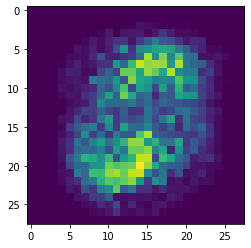

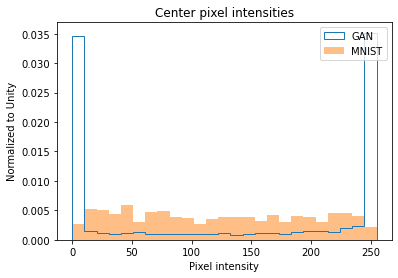

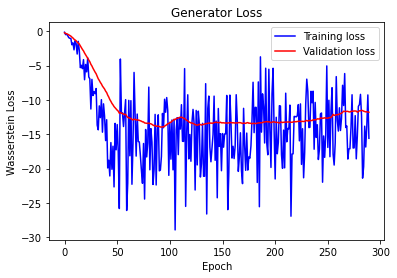

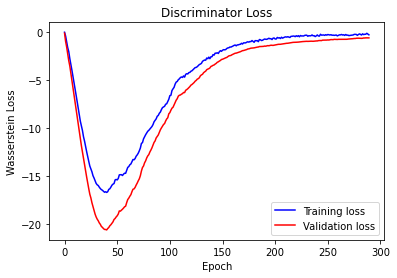

 29%|██▉       | 291/1000 [03:56<11:13,  1.05it/s]
Epoch 291:

Generator training loss: -15.436200073787141
Discriminator training loss: -0.20035142804096848

Generator validation loss: -11.808666433606827
Discriminator validation loss: -0.5976713342326028
 29%|██▉       | 292/1000 [03:57<10:25,  1.13it/s]
Epoch 292:

Generator training loss: -13.96573373249599
Discriminator training loss: -0.22084417904815856

Generator validation loss: -11.810034683772496
Discriminator validation loss: -0.602805699620928
 29%|██▉       | 293/1000 [03:58<09:40,  1.22it/s]
Epoch 293:

Generator training loss: -18.604535942985898
Discriminator training loss: -0.23757301783189183

Generator validation loss: -11.885535853249687
Discriminator validation loss: -0.5802629079137529
 29%|██▉       | 294/1000 [03:58<09:12,  1.28it/s]
Epoch 294:

Generator training loss: -11.062004112061999
Discriminator training loss: -0.11709702705099649

Generator validation loss: -11.848193236759732
Discriminator validation 

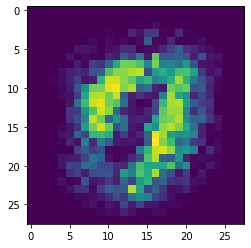

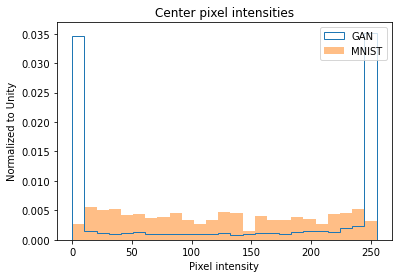

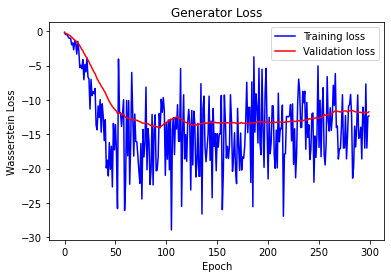

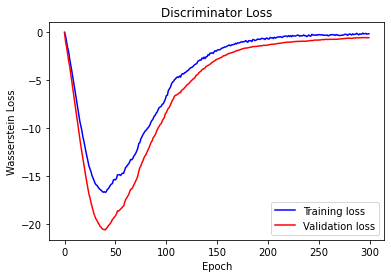

 30%|███       | 301/1000 [04:05<12:49,  1.10s/it]
Epoch 301:

Generator training loss: -15.554056735265819
Discriminator training loss: -0.28440031954752554

Generator validation loss: -11.680437632969449
Discriminator validation loss: -0.5947089280400957
 30%|███       | 302/1000 [04:06<11:39,  1.00s/it]
Epoch 302:

Generator training loss: -12.156393073853994
Discriminator training loss: -0.29564508556255265

Generator validation loss: -11.624183859143939
Discriminator validation loss: -0.5936231868607659
 30%|███       | 303/1000 [04:07<10:59,  1.06it/s]
Epoch 303:

Generator training loss: -13.722615242004395
Discriminator training loss: -0.23419003388179205

Generator validation loss: -11.613845280238559
Discriminator validation loss: -0.5962837636470795
 30%|███       | 304/1000 [04:08<10:44,  1.08it/s]
Epoch 304:

Generator training loss: -12.258959043593634
Discriminator training loss: -0.21772121726757004

Generator validation loss: -11.692932741982595
Discriminator validatio

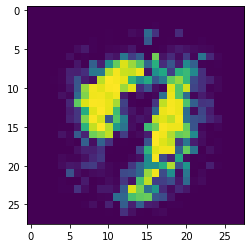

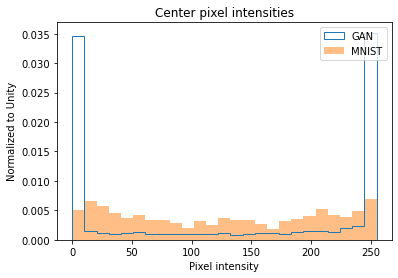

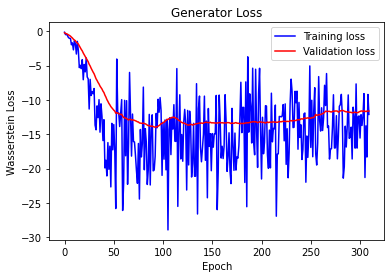

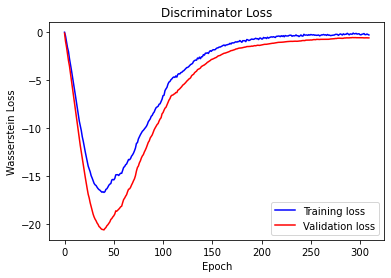

 31%|███       | 311/1000 [04:14<12:21,  1.08s/it]
Epoch 311:

Generator training loss: -9.086775325593495
Discriminator training loss: -0.20234874325493973

Generator validation loss: -11.611356939588278
Discriminator validation loss: -0.6467819895063128
 31%|███       | 312/1000 [04:15<11:15,  1.02it/s]
Epoch 312:

Generator training loss: -7.5734509740556994
Discriminator training loss: -0.25886149349666787

Generator validation loss: -11.602395262037005
Discriminator validation loss: -0.6647023558616639
 31%|███▏      | 313/1000 [04:16<10:46,  1.06it/s]
Epoch 313:

Generator training loss: -10.587294328780402
Discriminator training loss: -0.28564505791291595

Generator validation loss: -11.562077590397427
Discriminator validation loss: -0.6717464455536433
 31%|███▏      | 314/1000 [04:17<10:05,  1.13it/s]
Epoch 314:

Generator training loss: -11.9978472164699
Discriminator training loss: -0.3678810338356664

Generator validation loss: -11.515848909105573
Discriminator validation lo

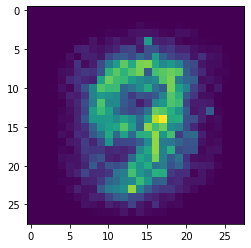

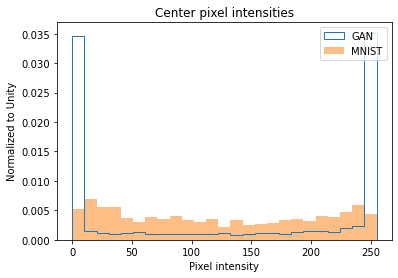

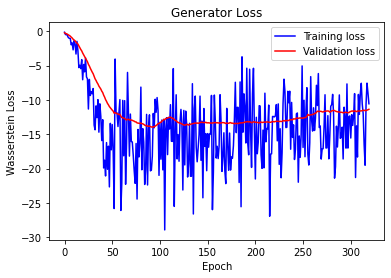

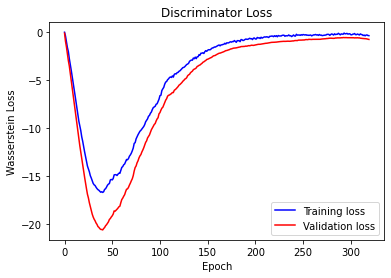

 32%|███▏      | 321/1000 [04:24<12:41,  1.12s/it]
Epoch 321:

Generator training loss: -8.883649167560396
Discriminator training loss: -0.369397952221334

Generator validation loss: -11.313976424080982
Discriminator validation loss: -0.7934817203453609
 32%|███▏      | 322/1000 [04:24<11:16,  1.00it/s]
Epoch 322:

Generator training loss: -7.405342147463844
Discriminator training loss: -0.40495012279245113

Generator validation loss: -11.299206869942802
Discriminator validation loss: -0.827794028179986
 32%|███▏      | 323/1000 [04:25<10:31,  1.07it/s]
Epoch 323:

Generator training loss: -19.35180073692685
Discriminator training loss: -0.42910483511514025

Generator validation loss: -11.34298528943743
Discriminator validation loss: -0.8326243119580407
 32%|███▏      | 324/1000 [04:26<09:42,  1.16it/s]
Epoch 324:

Generator training loss: -10.433297838483536
Discriminator training loss: -0.3713401442482358

Generator validation loss: -11.266759531838552
Discriminator validation loss: 

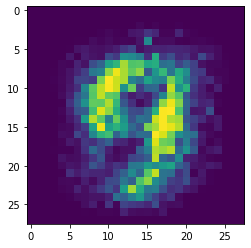

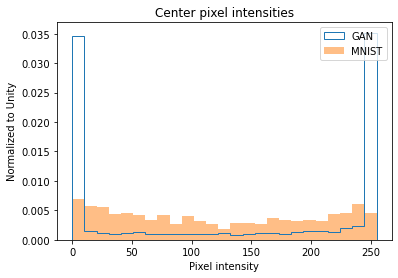

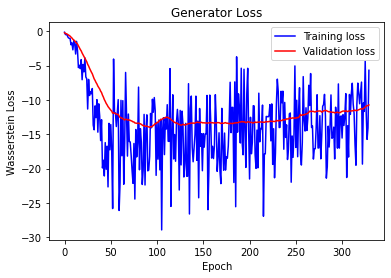

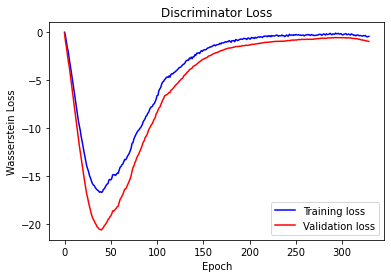

 33%|███▎      | 331/1000 [04:32<11:24,  1.02s/it]
Epoch 331:

Generator training loss: -17.03188033331008
Discriminator training loss: -0.5687230957028945

Generator validation loss: -10.677441324506486
Discriminator validation loss: -0.9951537719794682
 33%|███▎      | 332/1000 [04:33<10:31,  1.06it/s]
Epoch 332:

Generator training loss: -18.27468247640701
Discriminator training loss: -0.5720255941684756

Generator validation loss: -10.636306353977748
Discriminator validation loss: -1.0031343741076333
 33%|███▎      | 333/1000 [04:34<09:47,  1.14it/s]
Epoch 333:

Generator training loss: -13.918583052498954
Discriminator training loss: -0.48581580640304656

Generator validation loss: -10.514501776014056
Discriminator validation loss: -1.0147339275905063
 33%|███▎      | 334/1000 [04:35<09:17,  1.19it/s]
Epoch 334:

Generator training loss: -4.122402213868641
Discriminator training loss: -0.5420263132878712

Generator validation loss: -10.448249340057373
Discriminator validation loss

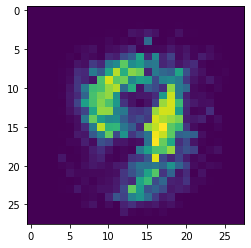

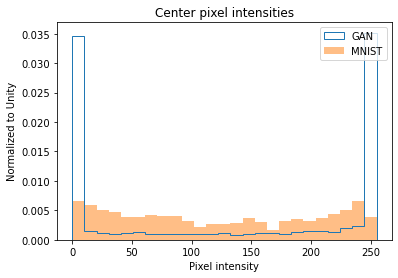

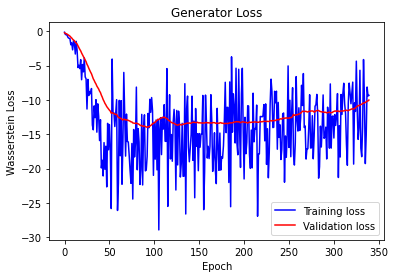

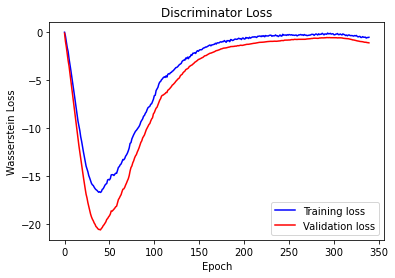

 34%|███▍      | 341/1000 [04:41<11:40,  1.06s/it]
Epoch 341:

Generator training loss: -9.229904129391624
Discriminator training loss: -0.5929745892506271

Generator validation loss: -9.98322228022984
Discriminator validation loss: -1.1597395794732233
 34%|███▍      | 342/1000 [04:42<10:44,  1.02it/s]
Epoch 342:

Generator training loss: -3.905815169924782
Discriminator training loss: -0.6081061804046232

Generator validation loss: -9.856645379747663
Discriminator validation loss: -1.1937254752431596
 34%|███▍      | 343/1000 [04:43<10:04,  1.09it/s]
Epoch 343:

Generator training loss: -18.178795065198628
Discriminator training loss: -0.680853043283735

Generator validation loss: -9.722533021654401
Discriminator validation loss: -1.1914824928556171
 34%|███▍      | 344/1000 [04:44<09:35,  1.14it/s]
Epoch 344:

Generator training loss: -5.180877958025252
Discriminator training loss: -0.6202132625594027

Generator validation loss: -9.594555037362236
Discriminator validation loss: -1.22

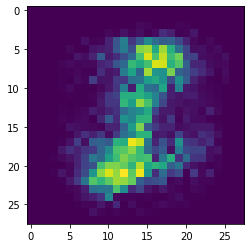

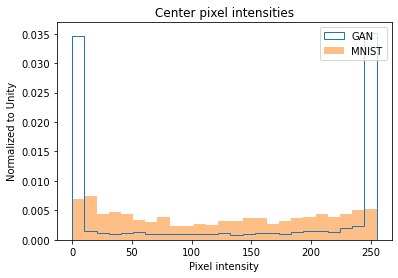

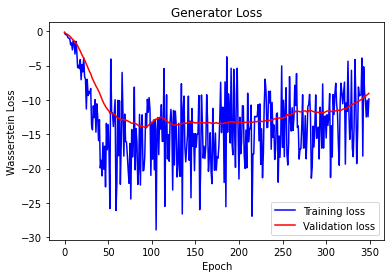

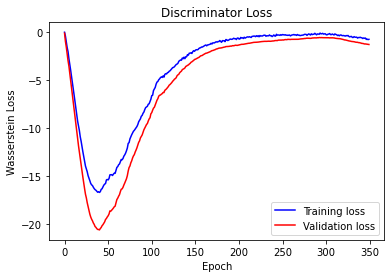

 35%|███▌      | 351/1000 [04:51<12:34,  1.16s/it]
Epoch 351:

Generator training loss: -13.268392426627024
Discriminator training loss: -0.6630399449107546

Generator validation loss: -8.905478818075999
Discriminator validation loss: -1.2956659793853762
 35%|███▌      | 352/1000 [04:52<11:14,  1.04s/it]
Epoch 352:

Generator training loss: -12.028943584078833
Discriminator training loss: -0.7509944438934327

Generator validation loss: -8.90617036819458
Discriminator validation loss: -1.3012228863579884
 35%|███▌      | 353/1000 [04:52<10:30,  1.03it/s]
Epoch 353:

Generator training loss: -14.41558758417765
Discriminator training loss: -0.7083556996214957

Generator validation loss: -8.837709767477852
Discriminator validation loss: -1.311549884932382
 35%|███▌      | 354/1000 [04:53<09:47,  1.10it/s]
Epoch 354:

Generator training loss: -13.124811081659224
Discriminator training loss: -0.7409894736040205

Generator validation loss: -8.708072662353512
Discriminator validation loss: -1.

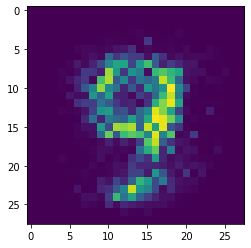

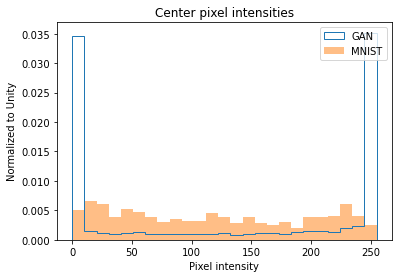

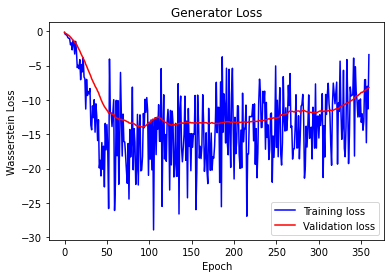

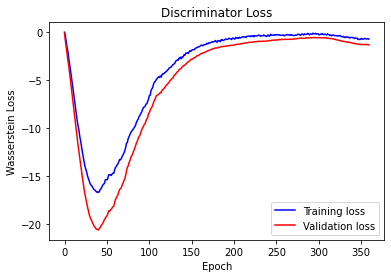

 36%|███▌      | 361/1000 [05:01<12:11,  1.14s/it]
Epoch 361:

Generator training loss: -6.745598770323253
Discriminator training loss: -0.7754892103728794

Generator validation loss: -8.157919543130058
Discriminator validation loss: -1.3604648283549718
 36%|███▌      | 362/1000 [05:01<11:05,  1.04s/it]
Epoch 362:

Generator training loss: -7.8015000479561945
Discriminator training loss: -0.7861421977480253

Generator validation loss: -8.114900588989258
Discriminator validation loss: -1.3628497464316232
 36%|███▋      | 363/1000 [05:02<10:14,  1.04it/s]
Epoch 363:

Generator training loss: -9.894176324208578
Discriminator training loss: -0.8045997030678249

Generator validation loss: -8.094113758632114
Discriminator validation loss: -1.3532257761274065
 36%|███▋      | 364/1000 [05:03<09:39,  1.10it/s]
Epoch 364:

Generator training loss: -13.261902786436536
Discriminator training loss: -0.8427864767256238

Generator validation loss: -8.046161651611328
Discriminator validation loss: -1

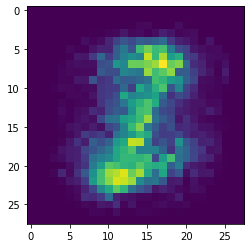

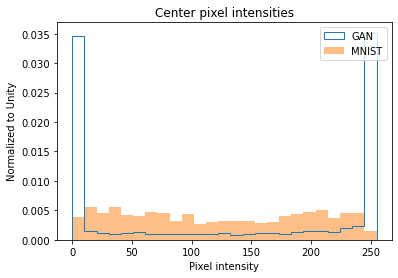

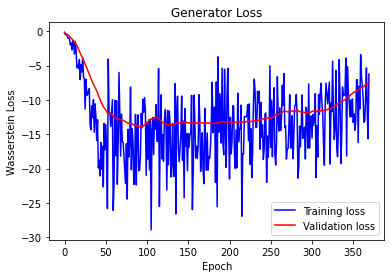

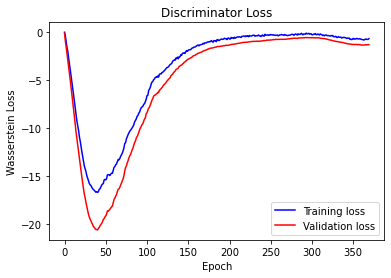

 37%|███▋      | 371/1000 [05:10<12:31,  1.19s/it]
Epoch 371:

Generator training loss: -7.220406986418224
Discriminator training loss: -0.7557073639971871

Generator validation loss: -7.4838026251111724
Discriminator validation loss: -1.258953963007246
 37%|███▋      | 372/1000 [05:11<11:31,  1.10s/it]
Epoch 372:

Generator training loss: -9.284493241991314
Discriminator training loss: -0.6675986420540582

Generator validation loss: -7.499677351542881
Discriminator validation loss: -1.301779704434531
 37%|███▋      | 373/1000 [05:12<10:38,  1.02s/it]
Epoch 373:

Generator training loss: -5.148072015671503
Discriminator training loss: -0.6748485192656515

Generator validation loss: -7.470262425286428
Discriminator validation loss: -1.3066828336034504
 37%|███▋      | 374/1000 [05:13<09:45,  1.07it/s]
Epoch 374:

Generator training loss: -7.054916109357562
Discriminator training loss: -0.6585462841959229

Generator validation loss: -7.4357171058654785
Discriminator validation loss: -1.2

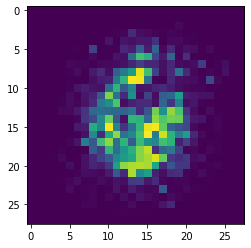

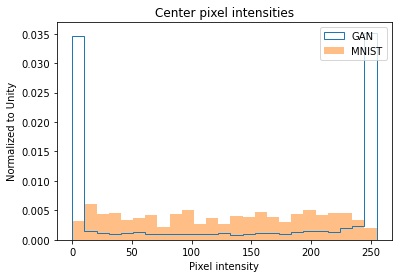

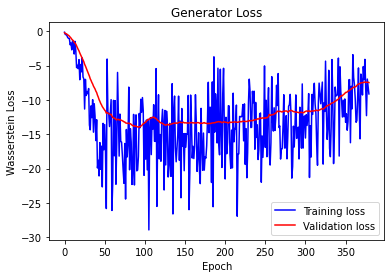

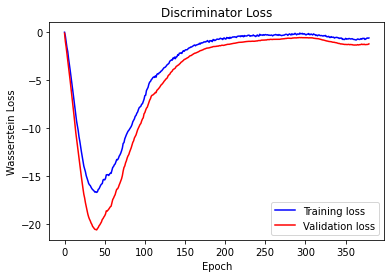

 38%|███▊      | 381/1000 [05:20<11:40,  1.13s/it]
Epoch 381:

Generator training loss: -5.117501417795817
Discriminator training loss: -0.645427193315256

Generator validation loss: -7.457431146076747
Discriminator validation loss: -1.2744309817041672
 38%|███▊      | 382/1000 [05:21<10:35,  1.03s/it]
Epoch 382:

Generator training loss: -4.08560003553118
Discriminator training loss: -0.6475249060562679

Generator validation loss: -7.480692556926182
Discriminator validation loss: -1.2604811191558838
 38%|███▊      | 383/1000 [05:22<09:47,  1.05it/s]
Epoch 383:

Generator training loss: -6.086463019961403
Discriminator training loss: -0.7183890552038237

Generator validation loss: -7.546748672212874
Discriminator validation loss: -1.2600062574659072
 38%|███▊      | 384/1000 [05:22<09:12,  1.12it/s]
Epoch 384:

Generator training loss: -9.282296612149192
Discriminator training loss: -0.6110841106800804

Generator validation loss: -7.597087860107422
Discriminator validation loss: -1.256

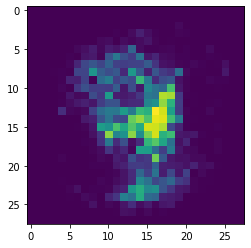

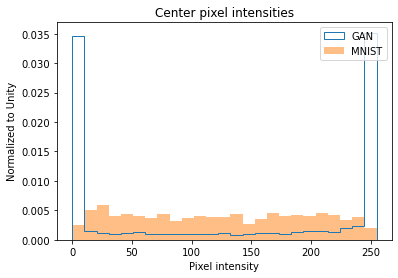

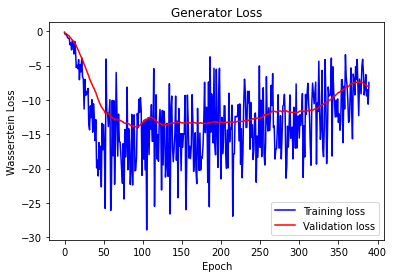

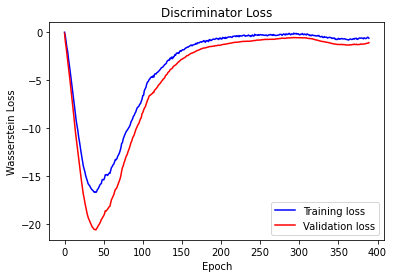

 39%|███▉      | 391/1000 [05:30<11:49,  1.16s/it]
Epoch 391:

Generator training loss: -8.577187628973098
Discriminator training loss: -0.5714214979892686

Generator validation loss: -8.142179625374931
Discriminator validation loss: -1.0881484704358235
 39%|███▉      | 392/1000 [05:30<10:36,  1.05s/it]
Epoch 392:

Generator training loss: -8.726779506320046
Discriminator training loss: -0.5984621420502664

Generator validation loss: -8.212959698268346
Discriminator validation loss: -1.069615696157728
 39%|███▉      | 393/1000 [05:31<10:02,  1.01it/s]
Epoch 393:

Generator training loss: -8.731366793314617
Discriminator training loss: -0.561221929355746

Generator validation loss: -8.300593989236015
Discriminator validation loss: -1.0541737845965795
 39%|███▉      | 394/1000 [05:32<09:14,  1.09it/s]
Epoch 394:

Generator training loss: -4.386511189596994
Discriminator training loss: -0.5716541079538209

Generator validation loss: -8.362178461892265
Discriminator validation loss: -1.082

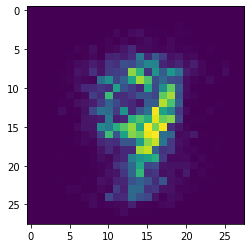

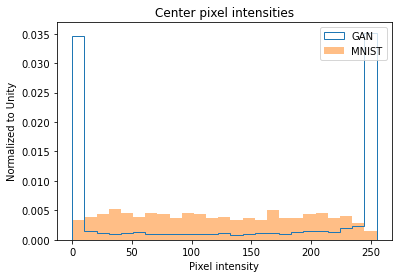

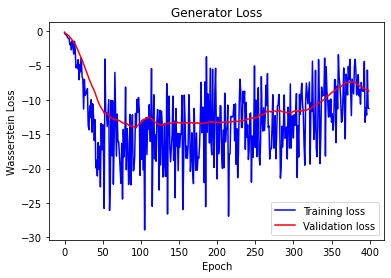

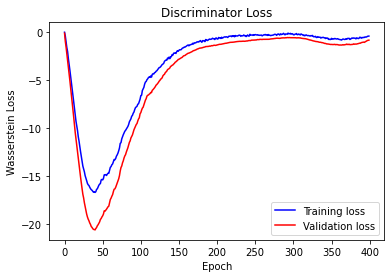

 40%|████      | 401/1000 [05:39<11:38,  1.17s/it]
Epoch 401:

Generator training loss: -6.7862487974621
Discriminator training loss: -0.40622146551807714

Generator validation loss: -8.797141483851842
Discriminator validation loss: -0.8496117293834686
 40%|████      | 402/1000 [05:40<10:51,  1.09s/it]
Epoch 402:

Generator training loss: -9.162360259464808
Discriminator training loss: -0.4479369052818843

Generator validation loss: -8.855560643332344
Discriminator validation loss: -0.8543672093323299
 40%|████      | 403/1000 [05:41<10:02,  1.01s/it]
Epoch 403:

Generator training loss: -9.232920237949916
Discriminator training loss: -0.4940076491662433

Generator validation loss: -8.988057885851177
Discriminator validation loss: -0.803029790520668
 40%|████      | 404/1000 [05:42<09:27,  1.05it/s]
Epoch 404:

Generator training loss: -12.737937314169749
Discriminator training loss: -0.3845899310849962

Generator validation loss: -9.108176163264684
Discriminator validation loss: -0.80

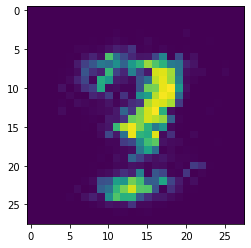

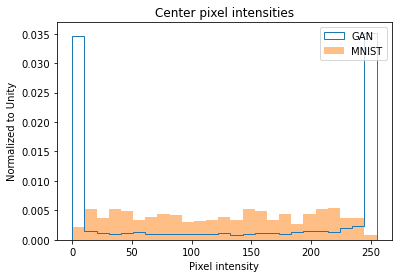

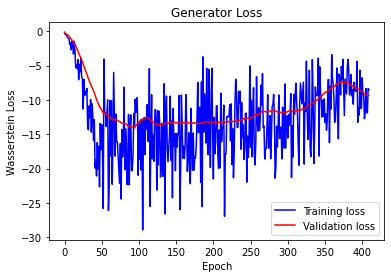

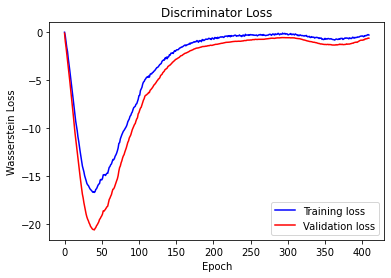

 41%|████      | 411/1000 [05:50<12:39,  1.29s/it]
Epoch 411:

Generator training loss: -11.978748071761359
Discriminator training loss: -0.26605184376239777

Generator validation loss: -9.543665136609757
Discriminator validation loss: -0.6170864360673086
 41%|████      | 412/1000 [05:51<11:12,  1.14s/it]
Epoch 412:

Generator training loss: -12.281906945364815
Discriminator training loss: -0.2857810576402005

Generator validation loss: -9.64239604132516
Discriminator validation loss: -0.5940820872783661
 41%|████▏     | 413/1000 [05:52<10:18,  1.05s/it]
Epoch 413:

Generator training loss: -14.802290598551435
Discriminator training loss: -0.23317257170787173

Generator validation loss: -9.753374712807789
Discriminator validation loss: -0.5229987416948592
 41%|████▏     | 414/1000 [05:52<09:39,  1.01it/s]
Epoch 414:

Generator training loss: -9.852691377912247
Discriminator training loss: -0.32343159154767087

Generator validation loss: -9.917574882507326
Discriminator validation loss:

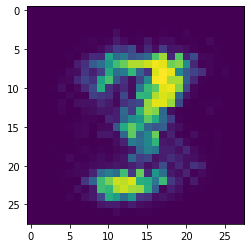

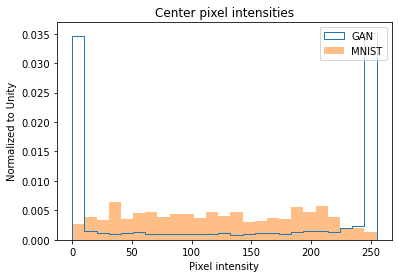

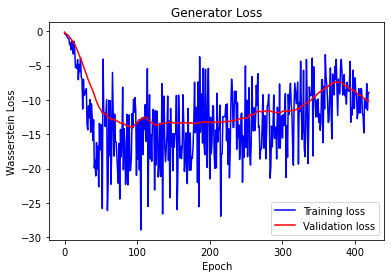

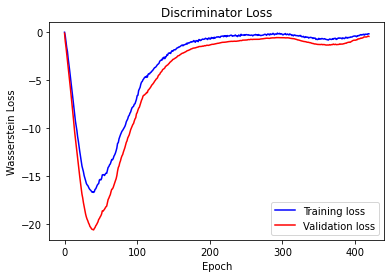

 42%|████▏     | 421/1000 [06:00<11:08,  1.15s/it]
Epoch 421:

Generator training loss: -10.14017559233166
Discriminator training loss: -0.2007852605699251

Generator validation loss: -10.134743554251534
Discriminator validation loss: -0.4397882414715631
 42%|████▏     | 422/1000 [06:00<09:59,  1.04s/it]
Epoch 422:

Generator training loss: -7.623907497950963
Discriminator training loss: -0.19714657618619857

Generator validation loss: -10.111285686492922
Discriminator validation loss: -0.4693543910980225
 42%|████▏     | 423/1000 [06:01<09:14,  1.04it/s]
Epoch 423:

Generator training loss: -3.7907439186459495
Discriminator training loss: -0.3119198825387729

Generator validation loss: -10.176553453717913
Discriminator validation loss: -0.45656850082533695
 42%|████▏     | 424/1000 [06:02<08:42,  1.10it/s]
Epoch 424:

Generator training loss: -14.137612638019382
Discriminator training loss: -0.2290134729728812

Generator validation loss: -10.279983724866595
Discriminator validation lo

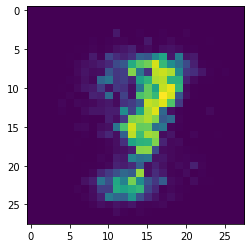

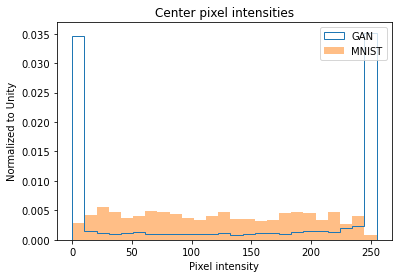

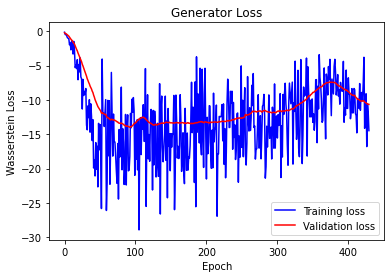

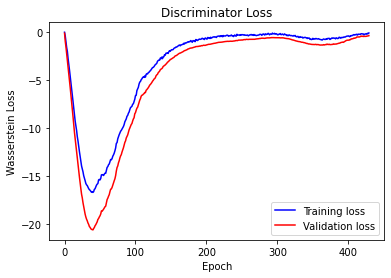

 43%|████▎     | 431/1000 [06:09<10:52,  1.15s/it]
Epoch 431:

Generator training loss: -13.221337795257568
Discriminator training loss: -0.13546064513779824

Generator validation loss: -10.61263404573713
Discriminator validation loss: -0.38926540315151215
 43%|████▎     | 432/1000 [06:10<10:00,  1.06s/it]
Epoch 432:

Generator training loss: -13.021714460282098
Discriminator training loss: -0.19360234570645146

Generator validation loss: -10.715196337018693
Discriminator validation loss: -0.37965878205639975
 43%|████▎     | 433/1000 [06:11<09:10,  1.03it/s]
Epoch 433:

Generator training loss: -6.552623226529075
Discriminator training loss: -0.16804510867223146

Generator validation loss: -10.748653888702393
Discriminator validation loss: -0.3984043406588691
 43%|████▎     | 434/1000 [06:12<08:51,  1.06it/s]
Epoch 434:

Generator training loss: -9.287192821502686
Discriminator training loss: -0.2584197656029746

Generator validation loss: -10.804381370544434
Discriminator validation 

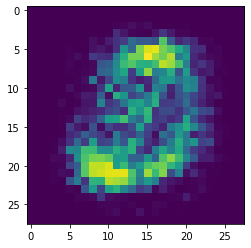

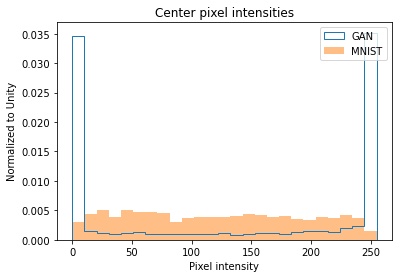

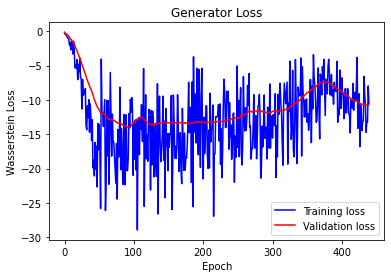

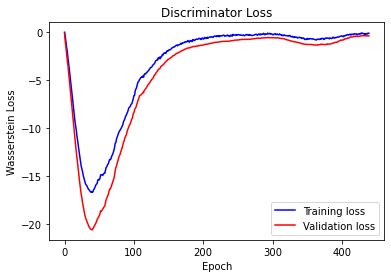

 44%|████▍     | 441/1000 [06:19<10:31,  1.13s/it]
Epoch 441:

Generator training loss: -10.576434248969667
Discriminator training loss: -0.17008468326890752

Generator validation loss: -10.84121288572039
Discriminator validation loss: -0.4284726679325103
 44%|████▍     | 442/1000 [06:20<09:38,  1.04s/it]
Epoch 442:

Generator training loss: -14.65148653302874
Discriminator training loss: -0.1535958008663285

Generator validation loss: -10.870774269104006
Discriminator validation loss: -0.4214272946119309
 44%|████▍     | 443/1000 [06:20<08:56,  1.04it/s]
Epoch 443:

Generator training loss: -14.521382763272241
Discriminator training loss: -0.15766434961309034

Generator validation loss: -10.819671971457346
Discriminator validation loss: -0.4395540484360286
 44%|████▍     | 444/1000 [06:21<08:31,  1.09it/s]
Epoch 444:

Generator training loss: -11.924985136304585
Discriminator training loss: -0.17026936351543376

Generator validation loss: -10.748484815870013
Discriminator validation l

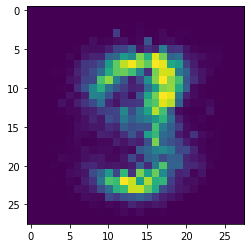

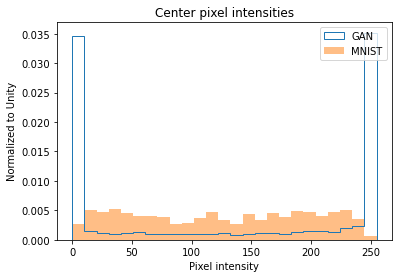

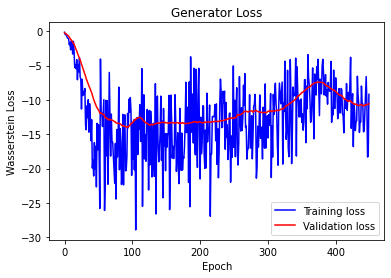

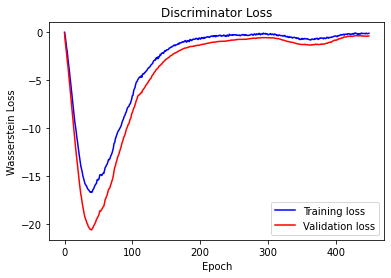

 45%|████▌     | 451/1000 [06:29<10:45,  1.18s/it]
Epoch 451:

Generator training loss: -9.065539269220261
Discriminator training loss: -0.12440657480398103

Generator validation loss: -10.62440095629011
Discriminator validation loss: -0.417400170649801
 45%|████▌     | 452/1000 [06:29<09:35,  1.05s/it]
Epoch 452:

Generator training loss: -14.348767484937396
Discriminator training loss: -0.1823897162186248

Generator validation loss: -10.732695170811244
Discriminator validation loss: -0.4217281086104257
 45%|████▌     | 453/1000 [06:30<08:53,  1.03it/s]
Epoch 453:

Generator training loss: -10.55189916065761
Discriminator training loss: -0.11176121849123209

Generator validation loss: -10.660031250544955
Discriminator validation loss: -0.42497482470103665
 45%|████▌     | 454/1000 [06:31<08:20,  1.09it/s]
Epoch 454:

Generator training loss: -8.994101115635463
Discriminator training loss: -0.11032067053020002

Generator validation loss: -10.642704623086113
Discriminator validation los

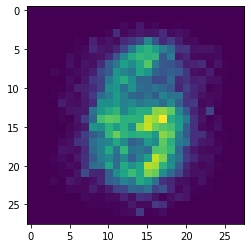

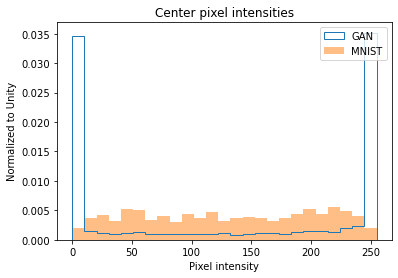

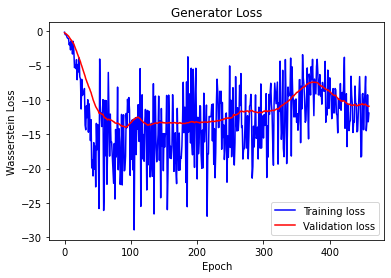

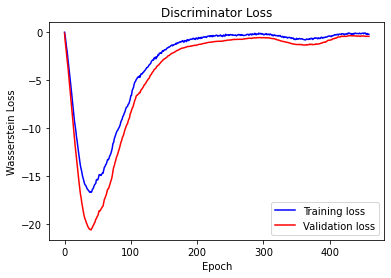

 46%|████▌     | 461/1000 [06:38<10:19,  1.15s/it]
Epoch 461:

Generator training loss: -10.651524861653645
Discriminator training loss: -0.2400902703493124

Generator validation loss: -10.980920791625977
Discriminator validation loss: -0.459845353450094
 46%|████▌     | 462/1000 [06:39<09:13,  1.03s/it]
Epoch 462:

Generator training loss: -9.235894907088506
Discriminator training loss: -0.1712111389885346

Generator validation loss: -10.932991777147565
Discriminator validation loss: -0.47254238171236856
 46%|████▋     | 463/1000 [06:40<08:38,  1.04it/s]
Epoch 463:

Generator training loss: -21.174074808756515
Discriminator training loss: -0.22039796767335032

Generator validation loss: -10.860838413238525
Discriminator validation loss: -0.4582094379833766
 46%|████▋     | 464/1000 [06:40<08:06,  1.10it/s]
Epoch 464:

Generator training loss: -6.553406601860409
Discriminator training loss: -0.22896800174688306

Generator validation loss: -10.818395546504432
Discriminator validation lo

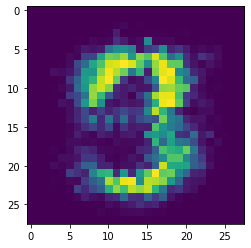

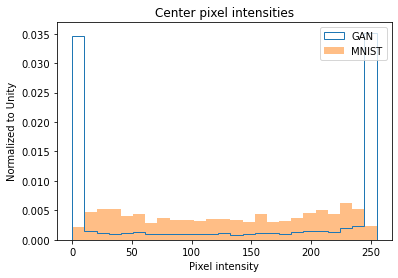

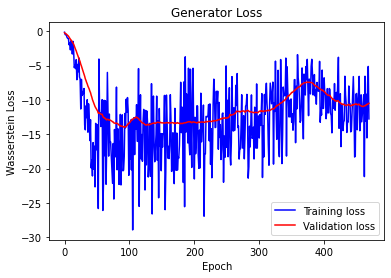

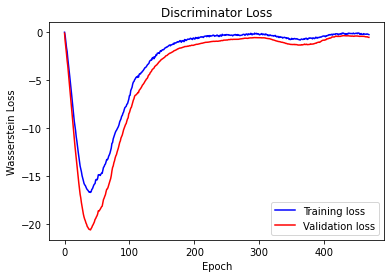

 47%|████▋     | 471/1000 [06:48<09:59,  1.13s/it]
Epoch 471:

Generator training loss: -10.15568494796753
Discriminator training loss: -0.29594110812814467

Generator validation loss: -10.447823660714286
Discriminator validation loss: -0.573879544224058
 47%|████▋     | 472/1000 [06:48<09:05,  1.03s/it]
Epoch 472:

Generator training loss: -7.547732761928014
Discriminator training loss: -0.32276359892317225

Generator validation loss: -10.369541236332484
Discriminator validation loss: -0.6008121456418719
 47%|████▋     | 473/1000 [06:49<08:28,  1.04it/s]
Epoch 473:

Generator training loss: -12.653930300758
Discriminator training loss: -0.2504219021869912

Generator validation loss: -10.454885619027273
Discriminator validation loss: -0.608367600611278
 47%|████▋     | 474/1000 [06:50<07:52,  1.11it/s]
Epoch 474:

Generator training loss: -13.880773498898462
Discriminator training loss: -0.28440615140079034

Generator validation loss: -10.410062108721052
Discriminator validation loss: 

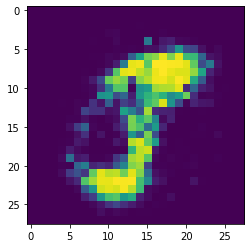

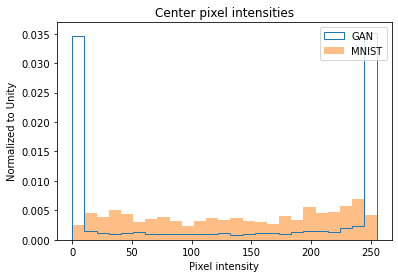

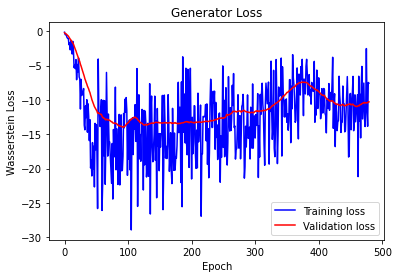

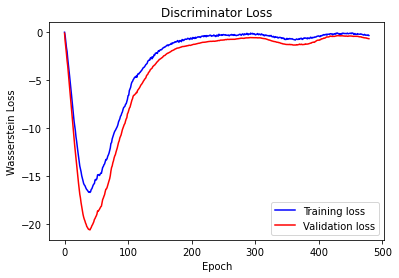

 48%|████▊     | 481/1000 [06:57<09:53,  1.14s/it]
Epoch 481:

Generator training loss: -7.466915789104643
Discriminator training loss: -0.3782136744287397

Generator validation loss: -10.279587541307722
Discriminator validation loss: -0.7342051310198647
 48%|████▊     | 482/1000 [06:58<09:09,  1.06s/it]
Epoch 482:

Generator training loss: -11.19054601306007
Discriminator training loss: -0.35174373572780976

Generator validation loss: -10.241104670933316
Discriminator validation loss: -0.7430403828620911
 48%|████▊     | 483/1000 [06:59<08:37,  1.00s/it]
Epoch 483:

Generator training loss: -4.940935089474633
Discriminator training loss: -0.35515438991465736

Generator validation loss: -10.059946741376605
Discriminator validation loss: -0.7461712871279036
 48%|████▊     | 484/1000 [07:00<08:00,  1.07it/s]
Epoch 484:

Generator training loss: -8.534395808265321
Discriminator training loss: -0.3579272075689264

Generator validation loss: -10.040452344076973
Discriminator validation loss

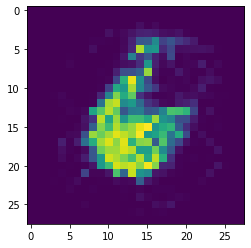

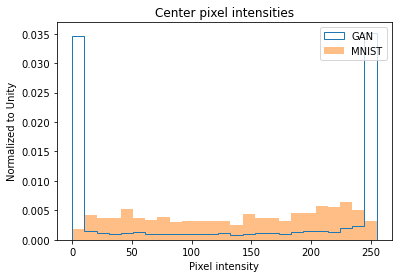

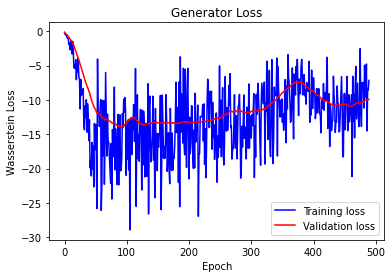

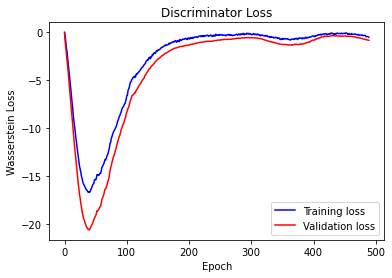

 49%|████▉     | 491/1000 [07:07<10:02,  1.18s/it]
Epoch 491:

Generator training loss: -11.923208236694336
Discriminator training loss: -0.5232635567053441

Generator validation loss: -9.909162385123118
Discriminator validation loss: -0.86046855364527
 49%|████▉     | 492/1000 [07:08<09:11,  1.08s/it]
Epoch 492:

Generator training loss: -12.146378471737815
Discriminator training loss: -0.5505568613963467

Generator validation loss: -10.008717128208705
Discriminator validation loss: -0.8500851818493435
 49%|████▉     | 493/1000 [07:08<08:31,  1.01s/it]
Epoch 493:

Generator training loss: -8.311728295825777
Discriminator training loss: -0.5231770308954375

Generator validation loss: -9.942854131971089
Discriminator validation loss: -0.8630140551498957
 49%|████▉     | 494/1000 [07:09<07:55,  1.06it/s]
Epoch 494:

Generator training loss: -15.369058563595727
Discriminator training loss: -0.49232810593786697

Generator validation loss: -9.95184871128627
Discriminator validation loss: -0

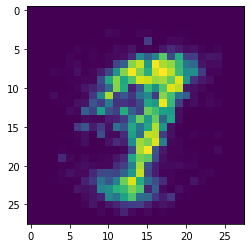

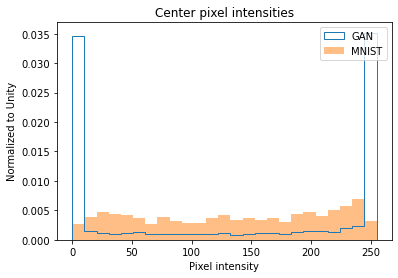

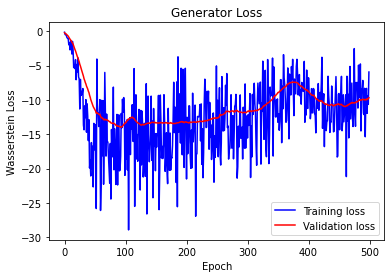

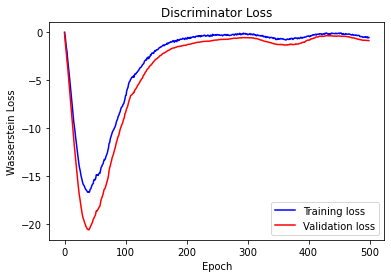

 50%|█████     | 501/1000 [07:16<09:21,  1.12s/it]
Epoch 501:

Generator training loss: -9.42563397543771
Discriminator training loss: -0.5388593398744151

Generator validation loss: -9.596560478210451
Discriminator validation loss: -0.9318835437297821
 50%|█████     | 502/1000 [07:17<08:28,  1.02s/it]
Epoch 502:

Generator training loss: -6.926621141887847
Discriminator training loss: -0.5996836870908738

Generator validation loss: -9.39479569026402
Discriminator validation loss: -0.9472735609327043
 50%|█████     | 503/1000 [07:18<07:49,  1.06it/s]
Epoch 503:

Generator training loss: -6.751250539507185
Discriminator training loss: -0.57899993684675

Generator validation loss: -9.348032542637418
Discriminator validation loss: -0.9753571322986058
 50%|█████     | 504/1000 [07:19<07:17,  1.13it/s]
Epoch 504:

Generator training loss: -5.644747416178386
Discriminator training loss: -0.6214840997542652

Generator validation loss: -9.308911664145334
Discriminator validation loss: -0.98413

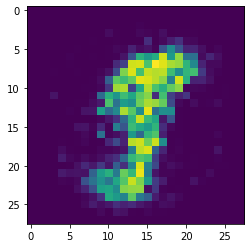

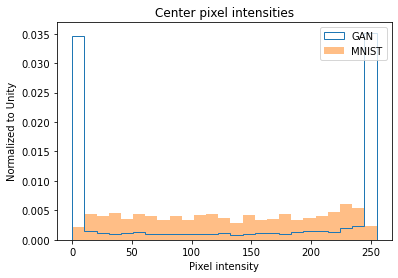

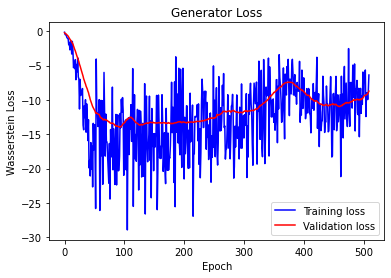

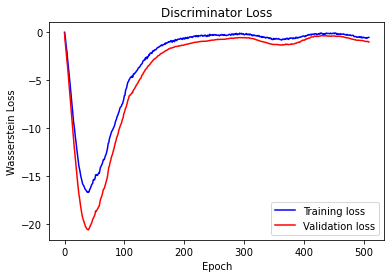

 51%|█████     | 511/1000 [07:26<09:34,  1.18s/it]
Epoch 511:

Generator training loss: -11.605850855509441
Discriminator training loss: -0.6557507891030541

Generator validation loss: -8.639850888933454
Discriminator validation loss: -1.0462066871779305
 51%|█████     | 512/1000 [07:27<08:38,  1.06s/it]
Epoch 512:

Generator training loss: -16.9630385580517
Discriminator training loss: -0.6286854225964773

Generator validation loss: -8.701473236083986
Discriminator validation loss: -1.0148930081299372
 51%|█████▏    | 513/1000 [07:28<08:04,  1.01it/s]
Epoch 513:

Generator training loss: -10.535496757144019
Discriminator training loss: -0.6418494823433105

Generator validation loss: -8.738998753683909
Discriminator validation loss: -0.9811787179538182
 51%|█████▏    | 514/1000 [07:28<07:38,  1.06it/s]
Epoch 514:

Generator training loss: -10.605354082016717
Discriminator training loss: -0.5083407478495722

Generator validation loss: -8.653198582785471
Discriminator validation loss: -0

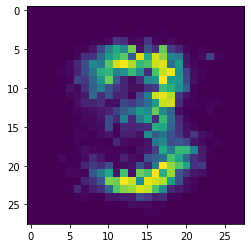

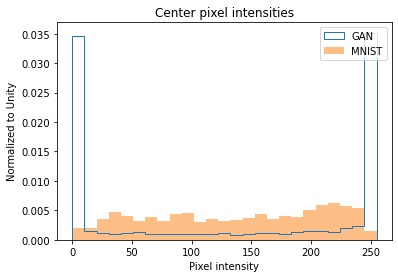

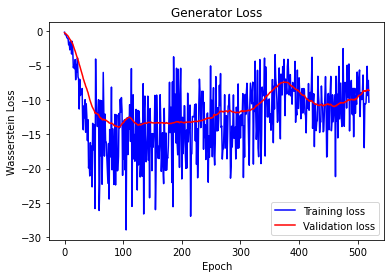

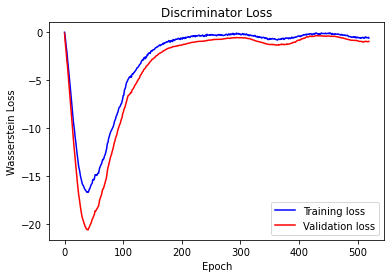

 52%|█████▏    | 521/1000 [07:36<09:19,  1.17s/it]
Epoch 521:

Generator training loss: -8.40715351558867
Discriminator training loss: -0.5737028175166675

Generator validation loss: -8.533882549830846
Discriminator validation loss: -0.9481669962406158
 52%|█████▏    | 522/1000 [07:36<08:26,  1.06s/it]
Epoch 522:

Generator training loss: -10.245265052432105
Discriminator training loss: -0.5494516486568111

Generator validation loss: -8.490229742867605
Discriminator validation loss: -0.9480581198419843
 52%|█████▏    | 523/1000 [07:37<07:44,  1.03it/s]
Epoch 523:

Generator training loss: -8.325808842976889
Discriminator training loss: -0.557827721926428

Generator validation loss: -8.473180362156459
Discriminator validation loss: -0.9706659018993377
 52%|█████▏    | 524/1000 [07:38<07:18,  1.08it/s]
Epoch 524:

Generator training loss: -10.275679997035436
Discriminator training loss: -0.5432546071353415

Generator validation loss: -8.486991677965436
Discriminator validation loss: -0.9

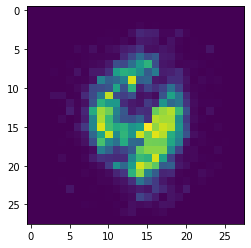

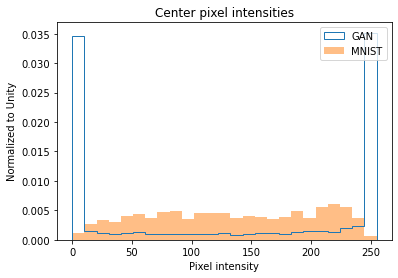

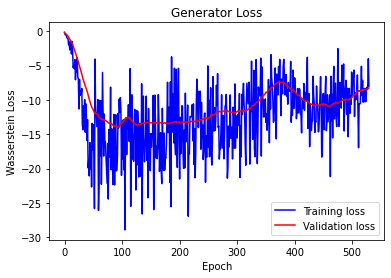

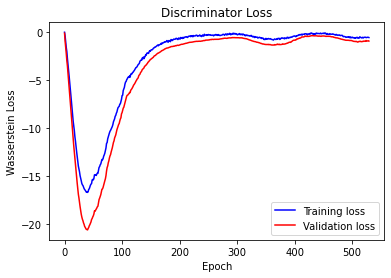

 53%|█████▎    | 531/1000 [07:46<11:01,  1.41s/it]
Epoch 531:

Generator training loss: -3.0281851405189153
Discriminator training loss: -0.5951939338729496

Generator validation loss: -8.134187630244664
Discriminator validation loss: -1.014349068914141
 53%|█████▎    | 532/1000 [07:47<09:51,  1.26s/it]
Epoch 532:

Generator training loss: -5.8064193952651255
Discriminator training loss: -0.6358718258284387

Generator validation loss: -8.023662635258265
Discriminator validation loss: -1.0073271989822388
 53%|█████▎    | 533/1000 [07:48<09:05,  1.17s/it]
Epoch 533:

Generator training loss: -6.81933879852295
Discriminator training loss: -0.648298207138266

Generator validation loss: -7.929918970380511
Discriminator validation loss: -0.9958697046552386
 53%|█████▎    | 534/1000 [07:49<08:38,  1.11s/it]
Epoch 534:

Generator training loss: -8.548909141903831
Discriminator training loss: -0.5990333060423532

Generator validation loss: -7.897059031895228
Discriminator validation loss: -0.96

KeyboardInterrupt: 

In [28]:
train(train_dataset, test_dataset, EPOCHS, N_CRITIC)

## Results
???